# PHASE 3 PROJECT
## Tanzanian WaterWells
HOSTED BY DRIVENDATA

<img src="images/waterwave.jpg">

### Business Problem

Tanzania ministry of agriculture wishes to upgrade the available waterpoints in Tanzania. They wish to know in advance which waterpoints are still functional, those that are functional but are in poor conditions and hence may need repairs and also to know those that are not functional at all. The ministry wishes for me to come up with a cost effective way which will enable them to identify and allocate sufficient resources to the needed areas.Through this project, the ministry is able to sufficiently plan and allocate resources to areas which would be in need of access to water. We all know how important water is to the daily activity of human beings, therefore the solutions in this project will go a long way in helping governments and organizations to plan how to implement water policies in Tanzania.

### Data

This data was obtained from the DrivenData platform, which is a platform that hosts competitions for data scientist with regards to data that is about the social aspects of the human life. The data set contains about 42 columns with majority of the variables being categorical variables. This will suit out analysis as we aim to come up with a classification model that best suits the problem we are trying to solve.

### Objective

My aim for this project is to come up with a classification model which can help the ministry identify waterpoints that need attention both in the short term and long term view.

In [1]:
# Importing relevant libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# sklearn
## model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
## preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
# Classification
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
# metrics
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

# imblearn
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier

%matplotlib inline

In [2]:
# Importing the datasets
df1 = pd.read_csv("datasets/TZ-wells/training_set_values.csv")
df2 = pd.read_csv("datasets/TZ-wells/training_set_labels.csv")

### Explore
Checking the structure of the dataframes below. We start with the df1 dataframe:

In [28]:
print(df1.info())
df1.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [29]:
# Describe df1
df1.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [30]:
# Checking the structure of df2
print(df2.info())
df2.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            59400 non-null  int64 
 1   status_group  59400 non-null  object
dtypes: int64(1), object(1)
memory usage: 928.2+ KB
None


,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


/home/abbo/anaconda3/envs/learn-env/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


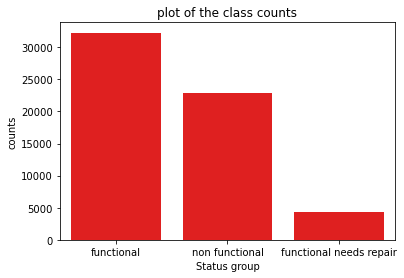

In [39]:
plot = sns.countplot(df2["status_group"], color= "red")
plot.set_xlabel("Status group")
plot.set_ylabel("counts")
plot.set_title("plot of the class counts")
plt.savefig("status group.png");

We observe that the two data frames are connecte and our target variable is in df2. We will merge these two dataframes into a combined dataframe before pre-processing and then we will split it into train and test sets for modeling.

## 2. EXPLORATORY DATA ANALYSIS
Below we perform EDA, first we will start by merging the two dataframes

In [4]:
# Merging the two dataframes
data = pd.merge(df1, df2)
data.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


Checking for duplicated rows.

In [5]:
data.duplicated().sum()

0

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

We see that the data has a good mix of numeric and object data types.

In [18]:
# Checking for missing values percentage
(data.isna().sum() / len(data)) * 100

id                        0.000000
amount_tsh                0.000000
date_recorded             0.000000
funder                    6.119529
gps_height                0.000000
installer                 6.153199
longitude                 0.000000
latitude                  0.000000
wpt_name                  0.000000
num_private               0.000000
basin                     0.000000
subvillage                0.624579
region                    0.000000
region_code               0.000000
district_code             0.000000
lga                       0.000000
ward                      0.000000
population                0.000000
public_meeting            5.612795
recorded_by               0.000000
scheme_management         6.526936
scheme_name              47.417508
permit                    5.144781
construction_year         0.000000
extraction_type           0.000000
extraction_type_group     0.000000
extraction_type_class     0.000000
management                0.000000
management_group    

A number of columns have missing values, with the scheme_name having the highest percentage of missing values. We will pay close attention to these columns first before trying to visualize and explore possible relationships between the different columns against the target variable. 

#### 1. scheme_name column
With the scheme name, we have no definitive way of transforming or filling in the missing values, my opinion is to make it a candidate for dropping. In addition it does not seem to be usefull to the question we are trying to answer. However tht is yet to be decided. We will drop the column in the next cell.

In [5]:
data.drop("scheme_name", axis= 1, inplace= True)

#### 2. funder column

In [42]:
data.funder.nunique()

1897

In [95]:
data.funder.value_counts()

Government Of Tanzania            9084
Danida                            3114
Hesawa                            2202
Rwssp                             1374
World Bank                        1349
Kkkt                              1287
World Vision                      1246
Unicef                            1057
Tasaf                              877
District Council                   843
Dhv                                829
Private Individual                 826
Dwsp                               811
0                                  777
Norad                              765
Germany Republi                    610
Tcrs                               602
Ministry Of Water                  590
Water                              583
Dwe                                484
Netherlands                        470
Hifab                              450
Adb                                448
Lga                                442
Amref                              425
Fini Water               

In [28]:
data[data.funder.isna()]

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
34,41583,0.0,2011-02-23,NaN,-41,NaN,39.812912,-7.889986,Msikitini Wa Ijumaa,0,Rufiji,Kilombero B,Pwani,60,63,Mafia,Baleni,100,True,GeoData Consultants Ltd,VWC,NaN,False,0,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional
43,19282,0.0,2013-01-15,NaN,1642,NaN,34.967789,-4.628921,Mvae Primary,0,Internal,Mwarufyu,Singida,13,2,Singida Rural,Merya,1,True,GeoData Consultants Ltd,VWC,K,NaN,1980,mono,mono,motorpump,vwc,user-group,unknown,unknown,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,non functional
47,13620,0.0,2011-07-27,NaN,0,NaN,33.540607,-9.172905,Mahakamani,0,Lake Nyasa,Mpandapanda,Mbeya,12,4,Rungwe,Kiwira,0,True,GeoData Consultants Ltd,VWC,K,NaN,0,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
65,51072,0.0,2013-02-09,NaN,1415,NaN,34.621598,-5.173136,Nyambi,0,Internal,Mfumbu,Singida,13,2,Singida Rural,Naintiri,1,True,GeoData Consultants Ltd,VWC,M,NaN,1970,mono,mono,motorpump,vwc,user-group,unknown,unknown,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,non functional
71,17386,0.0,2011-03-31,NaN,0,NaN,34.462228,-8.575780,Kwa Manyusi Mlilo,0,Rufiji,Lembuka,Mbeya,12,7,Mbarali,Mawindi,0,True,GeoData Consultants Ltd,VWC,NaN,False,0,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,non functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59357,46563,0.0,2013-02-19,NaN,1635,NaN,34.971841,-5.098362,Shabani,0,Internal,Mampando A,Singida,13,2,Singida Rural,Ntuntu,1,True,GeoData Consultants Ltd,VWC,NaN,NaN,1980,nira/tanira,nira/tanira,handpump,vwc,user-group,unknown,unknown,unknown,unknown,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
59366,55232,0.0,2013-02-02,NaN,1541,NaN,34.765729,-5.027725,Joshoni,0,Internal,Mungumaho,Singida,13,2,Singida Rural,Puma,200,True,GeoData Consultants Ltd,VWC,NaN,NaN,2000,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional
59370,14796,200.0,2013-01-29,NaN,1154,NaN,30.058731,-4.902633,Village Office,0,Lake Tanganyika,Mazungwe,Kigoma,16,2,Kasulu,Rusesa,1,True,GeoData Consultants Ltd,NaN,NaN,False,0,other,other,other,unknown,unknown,pay monthly,monthly,unknown,unknown,unknown,unknown,unknown,other,unknown,other,other,functional
59376,34716,0.0,2013-02-03,NaN,1581,NaN,34.821039,-5.076258,Nasingo,0,Internal,Hu,Singida,13,2,Singida Rural,Dung'unyi,1,True,GeoData Consultants Ltd,VWC,NaN,NaN,1990,other,other,other,vwc,user-group,unknown,unknown,unknown,unknown,dry,dry,shallow well,shallow well,groundwater,other,other,non functional


We can see from the cells above, the funder column contains 3635 values. It is a categorical column, I see it fit to impute another category "Other" which will indicate that the well was funded through a different initiative, this could be individual and private endeavors or Community initiated actions. I will group the major contributors into different groups.

In [6]:
# filling the null values with unknown
data.funder.fillna("Unknown", inplace= True)
data.funder.isna().sum()

0

I have observed that there is a category which contains zero as its value class, this we will change to the Unknown category. Also there are some string values which could be standardized to ensure that the values are uniform. For example, we could change the values of Roman Cathoric, Roman Church to Catholic, Angrikana to Anglican, Rwsssp to Rwssp, Serikari to Government Of Tanzania

In [7]:
data.loc[data["funder"] == "0", "funder"] = "unknown"

In [8]:
data["funder"] = data["funder"].apply(lambda x: x.lower())

In [9]:
unknown = ["none", "known"]

church_orgs = ["roman", "cathor", "churc", "aic", "mission", "missi",
               "kanisa", "wokovu", "walokole", "christian", "parish", "dioce"]
islamic_orgs = ["islam", "msikiti", "mosque", "musli", "musili"]

n_government = ["tanzania", "ministry", "rural", "tanza", "idara", 
                "tasaf", "parasta", "wizara", "central", "rwssp", "rss"]
l_government = ["district", "council", "serika", "local"]
community = ["commu", "village", "kijiji"]

foreign_govnts = ["netherla", "nethalan", "swedish", "republi",
                  "kuwai", "europe", "china", "holla", "balozi", 
                  "finlan", "germany", "franc", "canad", "belgi", 
                  "british", "u.s.a", "sweden", "korea", "embassy", 
                  "italy", "horanzi", "colonial", "irish", "misri", "egypt"]

ngos = ["oikos", "unice", "world bank", "oxfam", "unesco",
        "wateraid", "isf", "amref", "plan", "cross", "foundation",
        "undp", "water aid", "international", "usaid", "action", "vision",
        "aid", "realief", "fund", "danida"]

In [10]:
data.loc[data["funder"].str.contains("|".join(unknown)), "funder"] = "unknown"
data.loc[data["funder"].str.contains("|".join(church_orgs)), "funder"] = "church_orgs"
data.loc[data["funder"].str.contains("|".join(islamic_orgs)), "funder"] = "islamic"
data.loc[data["funder"].str.contains("|".join(n_government)), "funder"] = "national_government"
data.loc[data["funder"].str.contains("|".join(l_government)), "funder"] = "local_government"
data.loc[data["funder"].str.contains("|".join(ngos)), "funder"] = "ngos"
data.loc[data["funder"].str.contains("|".join(community)), "funder"] = "community"
data.loc[data["funder"].str.contains("|".join(foreign_govnts)), "funder"] = "foreign_gvts"

In [11]:
groups = ["unknown", "church_orgs", "islamic", "national_government",
          "local_government", "ngos", "community", "foreign_gvts"]
data.loc[~data["funder"].isin(groups), "funder"] = "others"

In [55]:
funders = data.groupby("status_group")["funder"].value_counts().unstack()

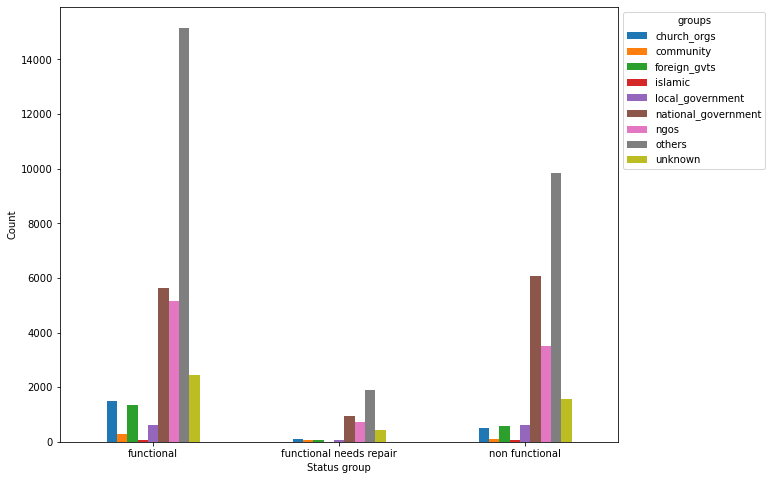

In [61]:
ax = funders.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='groups', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of funders vs Status Group");

#### 3. Installer
This column can be used to explain if the wells were installed through specialized help or otherwise. However there is no way to confirm if the group involved are certified professionals or not. It could be usefull if we are trying to find the functionality of wells in regards to who installed it and if they were qualified or not.

In [75]:
data.installer.nunique()

2145

In [190]:
data.installer.value_counts()

DWE                               17402
Government                         1825
RWE                                1206
Commu                              1060
DANIDA                             1050
KKKT                                898
Hesawa                              840
0                                   777
TCRS                                707
Central government                  622
CES                                 610
Community                           553
DANID                               552
District Council                    551
HESAWA                              539
LGA                                 408
World vision                        408
WEDECO                              397
TASAF                               396
District council                    392
Gover                               383
AMREF                               329
TWESA                               316
WU                                  301
Dmdd                                287


In [12]:
# altering rows which do not make much sense
data.loc[data["installer"] == "0", "installer"] = "unknown"
data.loc[data["installer"] == "-", "installer"] = "unknown"

In [13]:
data["installer"] = data["installer"].astype(str)

In [14]:
data["installer"] = data["installer"].apply(lambda x: x.lower())

Now I make changes to the column and try to group the row entries into different created groups.

In [15]:
ngos = ["aar","amre", "angli", "foundation", "trust", "internat",
        "care", "ushiri", "fpct", "allian", "fund", "grume", "hesawa", 
        "hees", "missi", "ox", "cross", "aid", "word", "bank", "world", "sion"]

foreign_gvt = ["americ", "austr", "belgi", "brit", "china",
               "chine", "coloni", "denish", "baloz", "egypt", 
               "fin", "holl", "iran", "itali", "embass", "japan", "misri", "nerth"]

church = ["aic", "chur", "angri", "catho", "christi", "crist", "dioce", 
          "missi", "sister", "wokov", "kanisa", "parish", "kkt", "luthe", 
          "othod", "pente", "rc", "roma", "kator"]
muslim = ["muslim", "isla", "msiki"]

l_community = ["communi", "fathe", "halma", "villager", "villaer", "village wa", "village te", "villi", "wanan"]
l_gvt = ["coun", "distr", "dw", "kijij", "villa", "ville"]
n_gvt = ["cebt", "cental", "central gov", "gove", "minist", "seri", "tanz", "board"]

unknown = ["kno"]

In [16]:
data.loc[data["installer"].str.contains("|".join(ngos)), "installer"] = "ngos"
data.loc[data["installer"].str.contains("|".join(foreign_gvt)), "installer"] = "foreign_gvt"
data.loc[data["installer"].str.contains("|".join(church)), "installer"] = "church"
data.loc[data["installer"].str.contains("|".join(muslim)), "installer"] = "muslim"
data.loc[data["installer"].str.contains("|".join(l_community)), "installer"] = "local_comm"
data.loc[data["installer"].str.contains("|".join(l_gvt)), "installer"] = "local_gvt"
data.loc[data["installer"].str.contains("|".join(n_gvt)), "installer"] = "national_gvt"
data.loc[data["installer"].str.contains("|".join(unknown)), "installer"] = "unknown"

In [17]:
installers = ["ngos", "foreign_gvt", "church", "muslim", "local_comm", "local_gvt", "national_gvt", "unknown"]
data.loc[~data["installer"].isin(installers), "installer"] = "other"

In [68]:
len(data.loc[data["installer"].isna()])

0

We will keep the columns with the imputed new entries.

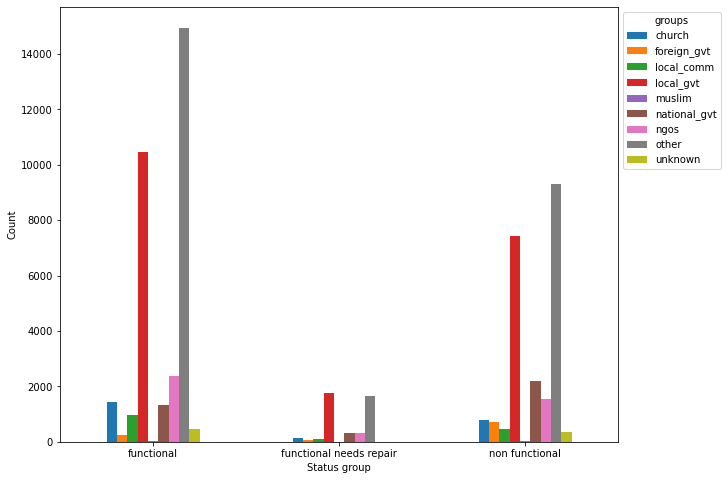

In [70]:
installers = data.groupby("status_group")["installer"].value_counts().unstack()
ax = installers.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='groups', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of installers vs Status Group");

#### 4. date_recorded & construction_year

In [77]:
data.date_recorded.head()

0    2011-03-14
1    2013-03-06
2    2013-02-25
3    2013-01-28
4    2011-07-13
Name: date_recorded, dtype: object

From above the column is of the object type. The column contains dates on which the records were being inserted in the dataset. The column again does not seem to be useful on what we are trying to predict. I would recommend dropping it. But first we could use it to obtain the age of the wells at the time of recording information on particular wells. To do that we would need to obtain the year and then convert it to the int data type.

In [18]:
# Slicing the Series then converting it to int type
data.date_recorded = [x[:4] for x in data.date_recorded]
data.date_recorded = data.date_recorded.astype(str).astype(float).astype(int)
data.date_recorded.info()

<class 'pandas.core.series.Series'>
Int64Index: 59400 entries, 0 to 59399
Series name: date_recorded
Non-Null Count  Dtype
--------------  -----
59400 non-null  int64
dtypes: int64(1)
memory usage: 928.1 KB


#### construction_year
Now we work on the construction_year column. We will use these two columns and try to obtain the age of the well.

In [12]:
data.construction_year.info()

<class 'pandas.core.series.Series'>
Int64Index: 59400 entries, 0 to 59399
Series name: construction_year
Non-Null Count  Dtype
--------------  -----
59400 non-null  int64
dtypes: int64(1)
memory usage: 928.1 KB


In [81]:
data.construction_year.nunique()

55

In [45]:
data.construction_year.value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [89]:
(data.construction_year.value_counts()[0] / len(data)) * 100

34.86363636363636

We have about 35 percent of the data being withought a known date of construction of the well. We will fill this values with the frequent year according to the region the wells are located in. First we find the value counts based on regions.

In [68]:
pd.DataFrame(data.groupby("region")["construction_year"].value_counts())

construction_year
region        construction_year                   
Arusha        2000                             487
              2002                             258
              2009                             216
              2010                             177
              2012                             174
              1990                             169
              1998                             169
              2008                             150
              2007                             146
              2011                             118
              2003                             107
              2006                             106
              2005                             104
              1978                              95
              1980                              94
              1970                              84
              1999                              77
              1994                              73
              1995                              58
              0                                 51
              2013                              39
              2001                              38
              2004                              38
              1963                              33
              1997                              29
              1968                              26
              1989                              26
              1996                              26
              1974                              25
              1973                              22
              1964                              13
              1982                              13
              1988                              13
              1991                              13
              1960                              10
              1977                              10
              1993                               9
              1983                               8
              1965                               7
              1985                               6
              1992                               6
              1967                               4
              1979                               4
              1961                               3
              1972                               3
              1975                               3
              1984                               3
              1986                               3
              1987                               3
              1962                               1
Dar es Salaam 2000                             373
              2010                             319
              1970                              62
              1990                              19
              0                                 17
              1980                              14
              1960                               1
Dodoma        0                               2201
Iringa        2009                             560
              2008                             485
              1978                             395
              0                                372
              2000                             340
              2010                             315
              1984                             217
              2006                             213
              2007                             192
              2004                             157
              2003                             152
              1992                             149
              1985                             109
              1990                             106
              1996                             103
              1974                             102
              1998                             102
              2002                              98
              2001                              95
    

Some of the regions have no entries on the year they were constructed. These will be filled with the most frequent year from the overall data.

In [19]:
def condition(df, column1, column2, area, value):
    cond = ((df[column1] == area) & (df[column2] == value))
    return cond

In [20]:
# employing the condition above
data.loc[condition(data, "region", "construction_year", "Arusha", 0), "construction_year"] = 2000
data.loc[condition(data, "region", "construction_year", "Dar es Salaam", 0), "construction_year"] = 2000
data.loc[condition(data, "region", "construction_year", "Iringa", 0), "construction_year"] = 2009
data.loc[condition(data, "region", "construction_year", "Kigoma", 0), "construction_year"] = 2009
data.loc[condition(data, "region", "construction_year", "Kilimanjaro", 0), "construction_year"] = 2008
data.loc[condition(data, "region", "construction_year", "Lindi", 0), "construction_year"] = 2010
data.loc[condition(data, "region", "construction_year", "Manyara", 0), "construction_year"] = 2012
data.loc[condition(data, "region", "construction_year", "Mara", 0), "construction_year"] = 2011
data.loc[condition(data, "region", "construction_year", "Morogoro", 0), "construction_year"] = 2010
data.loc[condition(data, "region", "construction_year", "Mtwara", 0), "construction_year"] = 1982
data.loc[condition(data, "region", "construction_year", "Pwani", 0), "construction_year"] = 2010
data.loc[condition(data, "region", "construction_year", "Rukwa", 0), "construction_year"] = 1984
data.loc[condition(data, "region", "construction_year", "Ruvuma", 0), "construction_year"] = 2009
data.loc[condition(data, "region", "construction_year", "Singida", 0), "construction_year"] = 2000
data.loc[condition(data, "region", "construction_year", "Tanga", 0), "construction_year"] = 2008

In [79]:
data.construction_year.value_counts().sort_index()

0       19680
1960      102
1961       21
1962       30
1963       85
1964       40
1965       19
1966       17
1967       88
1968       77
1969       59
1970      411
1971      145
1972      708
1973      184
1974      676
1975      437
1976      414
1977      202
1978     1037
1979      192
1980      811
1981      238
1982      831
1983      488
1984      781
1985      945
1986      434
1987      302
1988      521
1989      316
1990      954
1991      324
1992      640
1993      608
1994      738
1995     1014
1996      811
1997      644
1998      966
1999      979
2000     2167
2001      540
2002     1075
2003     1286
2004     1123
2005     1011
2006     1471
2007     1587
2008     2742
2009     2931
2010     2952
2011     1273
2012     1097
2013      176
Name: construction_year, dtype: int64

We will now fill the zero values with the median year of the whole column which is 1988.

In [21]:
data.loc[data.construction_year == 0, "construction_year"] = 1988
data["well_age"] = (data.date_recorded - data.construction_year)

In [21]:
# Dropping the two columns used above
data.drop(columns= ["date_recorded", "construction_year"], axis= 1, inplace= True)

In [26]:
len(data.loc[data["well_age"].isna()])

0

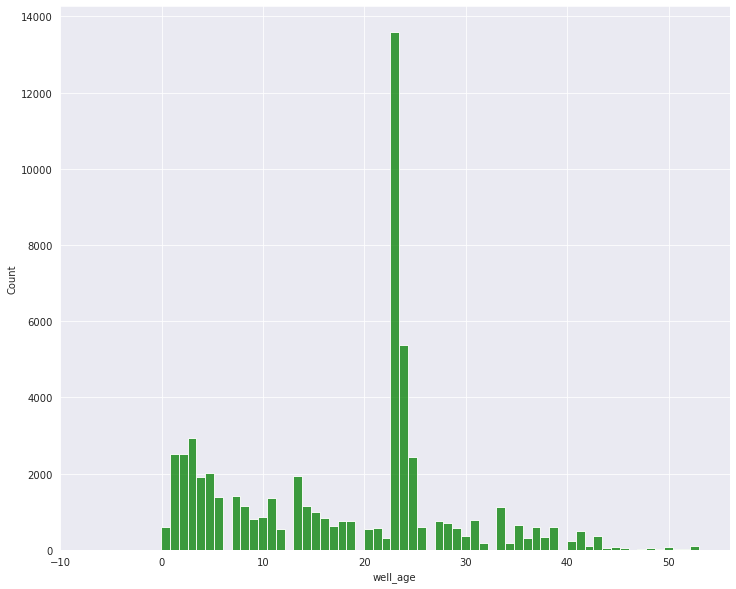

In [24]:
sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize = (12, 10))
sns.histplot(data = data, x = "well_age", bins = "auto", color = "green")
plt.savefig("Age of water points");

#### 5. gps_height
This column contains the altitude of the well, which is the height of the well above sea level.

In [11]:
data.gps_height.nunique()

2428

In [75]:
data.gps_height.value_counts().sort_index()

-90          1
-63          2
-59          1
-57          1
-55          1
-54          1
-53          1
-52          2
-51          2
-50          5
-49          4
-48          6
-47          8
-46          6
-45          9
-44          6
-43         11
-42         13
-41         11
-40         26
-39         14
-38         17
-37         19
-36         24
-35         18
-34         18
-33         22
-32         24
-31         26
-30         26
-29         26
-28         36
-27         42
-26         24
-25         34
-24         33
-23         45
-22         38
-21         40
-20         52
-19         47
-18         49
-17         44
-16         55
-15         60
-14         51
-13         55
-12         36
-11         41
-10         28
-9          38
-8          44
-7          38
-6          41
-5          38
-4          36
-3          38
-2          40
-1          22
 0       20438
 1          34
 2          28
 3          23
 4          24
 5          33
 6          33
 7        

I don't think there is much we can do for this column since both the positive and negative values are in indication of the whether the well is below or above sea level. We could create categories from the column by coming up with a column which indicates if a well is at sea level, below or above sea level. In this next cell I define a function to do just that:

In [25]:
# Jury still out

# def sea_level(altitude):
#     """This function creates categories for the columns
#     then assigns the level above sea level.
#     """
#     if altitude < 0:
#         return "below_sealevel"
#     elif altitude == 0:
#         return "at_sealevel"
#     elif 0 < altitude <= 500:
#         return "below_500m_sealevel"
#     elif 500 < altitude <= 1500:
#         return "below_1500m_sealevel"
#     elif 1500 < altitude <= 2500:
#         return "below_2500m_sealevel"
#     else:
#         return "above_2500m_sealevel"

In [26]:
# data["sealevel"] = data["gps_height"].apply(sea_level)

In [27]:
len(data.loc[data["gps_height"].isna()])

0

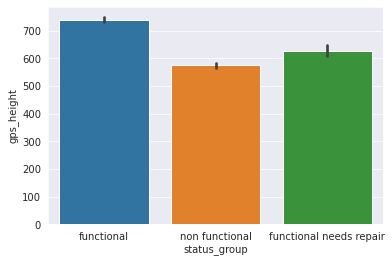

In [25]:
sns.barplot(x= "status_group", y= "gps_height", data= data);

#### 6. wpt_name
This column contains the names of the different waterpoints in the data. The names are and indication of the local location where the wells are located. They can be used to identify if wells are in public or private locations.

In [25]:
data.wpt_name.nunique()

37400

In [27]:
data.wpt_name.isna().sum()

0

In [17]:
data.wpt_name.value_counts().sort_index()

24                                   1
A Kulwa                              1
A Saidi                              1
Abass                                1
Abbas                                1
Abdala Hamisi                        1
Abdala Mwandute                      1
Abdalaa                              1
Abdalah                              3
Abdalah Ali                          1
Abdalah Mashaka                      1
Abdalah Miliki                       1
Abdalah Mwakibona                    1
Abdalah Shombe                       1
Abdalamani Mussa                     1
Abdalla Nambambili                   1
Abdallah Chingi                      1
Abdallah Miwani                      1
Abdallah Mponzi                      1
Abdallah Nassor Msabaha              1
Abdallah Nassoro                     1
Abdi                                 2
Abdieri Serakike                     1
Abdu                                 1
Abdul                                1
Abdul Sharif             

From above we observe that some wells are located in private residences. We will be changing this values to the appropriate locations. Example "Kwa Waziri" will be translated to "private_residence" etc. Given that these variables are many, cleaning could be a lot of trouble, These column could be leveraged to provide information on where the wells are located in that are they privately owned or are open to the public. However with the extensive categories in the column itself, it could be unrealistic to try and alter this values manually, therefore we drop this column.

In [26]:
data.drop("wpt_name", axis= 1, inplace= True)

#### 7. num_private

In [29]:
data.num_private.nunique()

65

In [33]:
data.num_private.value_counts().sort_index(ascending= False)

1776        1
1402        1
755         1
698         1
672         1
668         1
450         1
300         1
280         1
240         1
213         1
180         1
160         1
150         6
141         1
136         1
131         1
120         7
111         1
102        20
94          1
93         28
87          1
80         15
65         22
62          1
61          3
60          1
58          4
55          1
50          5
47         21
45         36
42          1
41         10
39         30
38          4
35          1
34         10
32         40
30          1
27          2
26          2
25         12
24          5
23          1
22          6
20         14
17         17
16          8
15         35
14          3
12          5
11         11
10          4
9           4
8          46
7          26
6          81
5          46
4          20
3          27
2          23
1          73
0       58643
Name: num_private, dtype: int64

The column above has a lot of values which are zeroes. Also we do not have adequate explanation about what information the column holds. It is a good candidate for dropping as the meaning of the column is lost to us.

In [27]:
data.drop("num_private", axis= 1, inplace = True)

#### 8. basin
This column holds information on the geographic water basin of the well.

In [130]:
data.basin.nunique()

9

In [131]:
data.basin.value_counts()

Lake Victoria              10248
Pangani                     8940
Rufiji                      7976
Internal                    7785
Lake Tanganyika             6432
Wami / Ruvu                 5987
Lake Nyasa                  5085
Ruvuma / Southern Coast     4493
Lake Rukwa                  2454
Name: basin, dtype: int64

In [36]:
data.basin.isna().sum()

0

In [24]:
# Changing some of the entries to be consistent
data.loc[data["basin"] == "Wami / Ruvu", "basin"] = "Wami_Ruvu"
data.loc[data["basin"] == "Lake Tanganyika", "basin"] = "Lake_Tanganyika"
data.loc[data["basin"] == "Lake Nyasa", "basin"] = "Lake_Nyasa"
data.loc[data["basin"] == "Ruvuma / Southern Coast", "basin"] = "Ruvuma_Southern_Coast"
data.loc[data["basin"] == "Lake Rukwa", "basin"] = "Lake_Rukwa"
data.loc[data["basin"] == "Lake Victoria", "basin"] = "Lake_Victoria"
data["basin"] = data["basin"].apply(lambda x: x.lower())

In [31]:
len(data.loc[data["basin"].isna()])

0

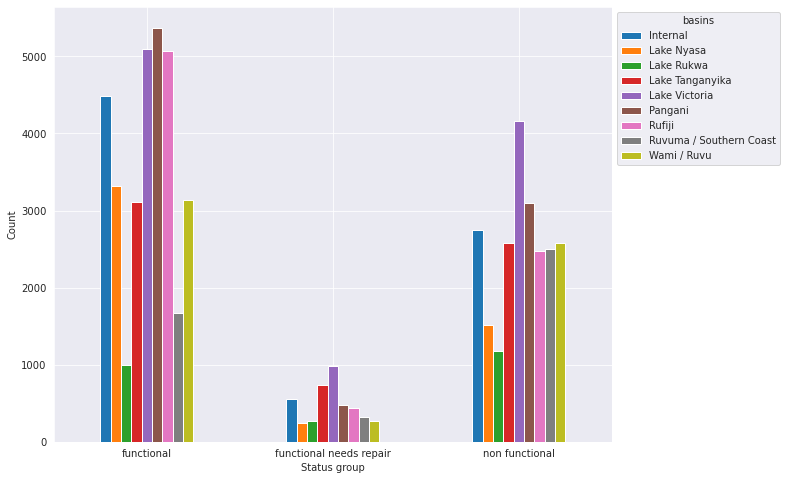

In [29]:
basin = data.groupby("status_group")["basin"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='basins', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of lake basins vs Status Group");

#### 9. subvillage
The column contains information about the location of wells in villages.

In [37]:
data.subvillage.nunique()

19287

In [39]:
data.subvillage.value_counts().sort_index()

##                                  1
'A' Kati                            1
1                                 132
14Kambalage                         5
18                                  1
19                                  3
20                                  1
22B                                 1
23B                                 1
24                                  1
24B                                 1
30                                  1
42                                  1
43                                  1
44                                  3
45                                  1
47                                  1
48                                  1
49                                  1
52 A                                1
53 A                                2
53 B                                1
54                                  2
58 B                                3
60                                  1
61 A                                1
61 B        

In [40]:
data.subvillage.isna().sum()

371

The column has 371 missing values. Some of the column entries are numeric values. The column contains geographic location at the lowest level. It could be useful but I feel there are other columns which provide the same information which would better suit what we are trying to do. Because of that, I feel we should drop this column.

In [30]:
data.drop("subvillage", axis= 1, inplace= True)

#### 10. region

In [31]:
data["region"] = data["region"].apply(lambda x: x.lower())

In [24]:
data.region.nunique()

21

In [25]:
data.region.value_counts()

iringa           5294
shinyanga        4982
mbeya            4639
kilimanjaro      4379
morogoro         4006
arusha           3350
kagera           3316
mwanza           3102
kigoma           2816
ruvuma           2640
pwani            2635
tanga            2547
dodoma           2201
singida          2093
mara             1969
tabora           1959
rukwa            1808
mtwara           1730
manyara          1583
lindi            1546
dar es salaam     805
Name: region, dtype: int64

In [34]:
len(data.loc[data["region"].isna()])

0

There are no missing values or any mislabeled values in this column. The column contains information on geographic locations of wells on a regional level. These could be a very useful column, so I choose to keep it.

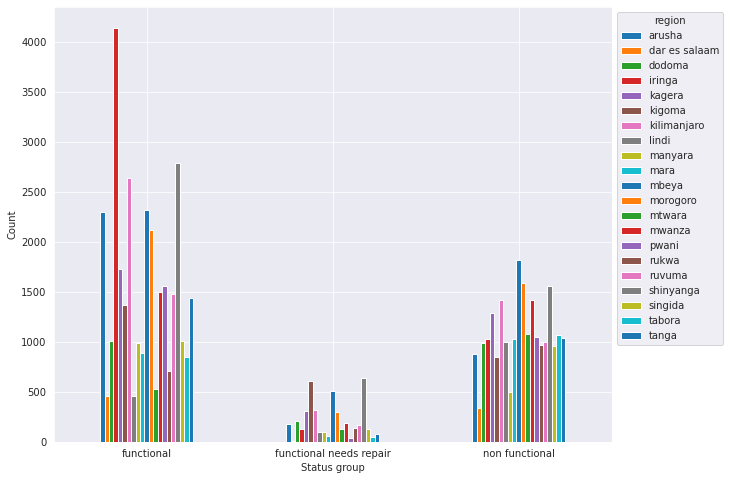

In [35]:
basin = data.groupby("status_group")["region"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='region', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of region vs Status Group");

#### 11. region_code

In [26]:
data.region_code.nunique()

27

Given that we expected 21 columns based on the number of regions available to us. It would be prudent to standardize the coded region based on the region column. From google we have observed that there are new codes for the regions. Source https://en.wikipedia.org/wiki/ISO_3166-2:TZ

In [27]:
data.region_code.value_counts()

11    5300
17    5011
12    4639
3     4379
5     4040
18    3324
19    3047
2     3024
16    2816
10    2640
4     2513
1     2201
13    2093
14    1979
20    1969
15    1808
6     1609
21    1583
80    1238
60    1025
90     917
7      805
99     423
9      390
24     326
8      300
40       1
Name: region_code, dtype: int64

In [36]:
data.loc[data["region"] == "Iringa", "region_code"] = 4
data.loc[data["region"] == "Shinyanga", "region_code"] = 22
data.loc[data["region"] == "Mbeya", "region_code"] = 14
data.loc[data["region"] == "Kilimanjaro", "region_code"] = 9
data.loc[data["region"] == "Morogoro", "region_code"] = 16
data.loc[data["region"] == "Arusha", "region_code"] = 1
data.loc[data["region"] == "Kagera", "region_code"] = 5
data.loc[data["region"] == "Mwanza", "region_code"] = 18
data.loc[data["region"] == "Kigoma", "region_code"] = 8
data.loc[data["region"] == "Ruvuma", "region_code"] = 21
data.loc[data["region"] == "Pwani", "region_code"] = 19
data.loc[data["region"] == "Tanga", "region_code"] = 25
data.loc[data["region"] == "Dodoma", "region_code"] = 3
data.loc[data["region"] == "Singida", "region_code"] = 23
data.loc[data["region"] == "Mara", "region_code"] = 13
data.loc[data["region"] == "Tabora", "region_code"] = 24
data.loc[data["region"] == "Rukwa", "region_code"] = 20
data.loc[data["region"] == "Mtwara", "region_code"] = 17
data.loc[data["region"] == "Manyara", "region_code"] = 26
data.loc[data["region"] == "Lindi", "region_code"] = 12
data.loc[data["region"] == "Dar es Salaam", "region_code"] = 2

In [37]:
data["region_code"] = data["region_code"].astype(str)

Since we have the region name, I don't think it is neccessary to keep the region code, therefore I drop it.

In [38]:
data.drop("region_code", axis= 1, inplace= True)

#### 12. district_code

In [30]:
data.district_code.nunique()

20

In [57]:
data.district_code.value_counts()

1     12203
2     11173
3      9998
4      8999
5      4356
6      4074
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: district_code, dtype: int64

The column contains encoded data of districts(location). We could search for which districts these codes belong too, but an extensive search has not yielded much fruit. The column contains a small number of encoded districts. These column could be considered a categorical column with a presence of districts in different regions. We transform these column below

In [39]:
data["district_code"] = data["district_code"].astype(str)

In [37]:
len(data.loc[data["district_code"].isna()])

0

#### 13. lga

In [88]:
data.lga.nunique()

125

In [43]:
data.lga.isna().sum()

0

In [42]:
data.lga.value_counts().sort_index()

Arusha Rural        1252
Arusha Urban          63
Babati               511
Bagamoyo             997
Bahi                 224
Bariadi             1177
Biharamulo           403
Bukoba Rural         487
Bukoba Urban          88
Bukombe              514
Bunda                438
Chamwino             347
Chato                236
Chunya               298
Dodoma Urban         358
Geita                488
Hai                  625
Hanang               274
Handeni              254
Igunga               338
Ilala                497
Ileje                231
Ilemela              142
Iramba               544
Iringa Rural         728
Kahama               836
Karagwe              771
Karatu               326
Kasulu              1047
Kibaha               269
Kibondo              874
Kigoma Rural         824
Kigoma Urban          71
Kilindi              161
Kilolo               349
Kilombero            959
Kilosa              1094
Kilwa                392
Kinondoni             93
Kisarawe             223


In [40]:
data["lga"] = data["lga"].apply(lambda x: x.lower())

This column contains geographic information. Since I have this information on a different level. It indicates how the different regions could be divided further ie into urban or urban areas. We transform this column to indicate that. We will also assign other areas as others to further breakdown the group.

In [41]:
data.loc[data["lga"].str.contains("urban"), "lga"] = "urban"
data.loc[data["lga"].str.contains("rural"), "lga"] = "rural"

In [42]:
def replace(col):
    if col == "rural":
        return "rural"
    elif col == "urban":
        return "urban"
    else:
        return "other"

In [43]:
data["lga"] = data["lga"].apply(replace)

In [44]:
data.lga.value_counts()

other    48165
rural     9552
urban     1683
Name: lga, dtype: int64

In [43]:
len(data.loc[data["lga"].isna()])

0

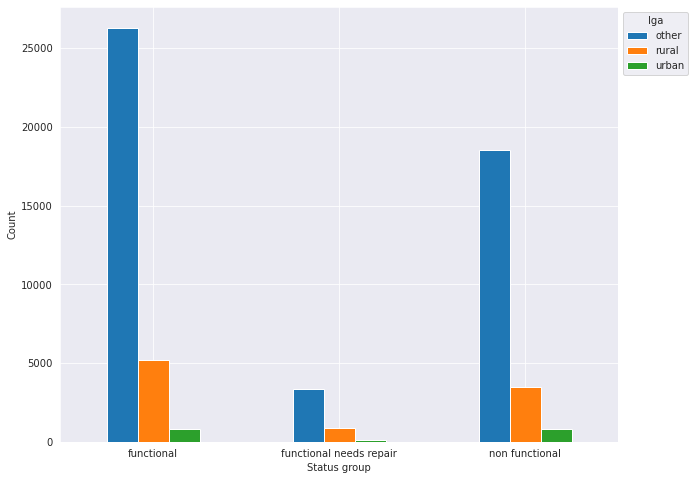

In [45]:
basin = data.groupby("status_group")["lga"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='lga', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of lga vs Status Group");

#### 14. ward
The column contains geographic information on an indepth level. Since I have this informatin on a regional level, I see no need to keep this information therefore will look to drop this column. The column contained no missing values.

In [93]:
data.ward.nunique()

2092

In [21]:
data.ward.value_counts()

Igosi                      307
Imalinyi                   252
Siha Kati                  232
Mdandu                     231
Nduruma                    217
Mishamo                    203
Kitunda                    203
Msindo                     201
Chalinze                   196
Maji ya Chai               190
Usuka                      187
Ngarenanyuki               172
Chanika                    171
Vikindu                    162
Mtwango                    153
Matola                     145
Zinga/Ikerege              141
Wanging'ombe               139
Maramba                    139
Itete                      137
Magomeni                   135
Ifakara                    134
Kikatiti                   134
Olkokola                   133
Maposeni                   130
Mvomero                    129
Igongolo                   129
Mlangali                   125
Nkoma                      122
Nkungulu                   121
Mahongole                  121
Rujewa                     120
Simbo   

In [46]:
data["ward"] = data["ward"].apply(lambda x: x.lower())

The column could be usefull but I don't see it's important currently, therefore I choose to drop it.

In [47]:
data.drop("ward", axis= 1, inplace= True)

#### 15. population
This column contains information about the general population around the wells.

In [98]:
data.population.nunique()

1049

In [100]:
data.population.value_counts().sort_index()

0        21381
1         7025
2            4
3            4
4           13
5           44
6           19
7            3
8           23
9           11
10         163
11           7
12          43
13          12
14          18
15         193
16           8
17           6
18          18
19           3
20         462
21           3
22           9
23          27
24          16
25         255
26          11
27           5
28           9
29           7
30         626
31           1
32          17
33           9
34          10
35         245
36          57
37           4
38           9
39           3
40         552
41           3
42          29
43           7
44          10
45         205
46           7
47           4
48          22
49           9
50        1139
51           8
52          32
53          59
54          19
55         116
56         150
57          15
58          25
59          15
60         706
61           4
62           4
63          31
64           5
65         175
66        

The column contains some unrealistic values about population on a well. Not sure how to deal with them. Dropping the column would be an option but I feel a lot of information could be lost. Scaling could help in this aspect so for now we keep the column. Also there might be a relation between the population with another variable in the dataset.

In [46]:
len(data.loc[data["population"].isna()])

0

#### 16. public_meeting
This is a categorical column indicating whether a public meeting was conducted prior to construction of the well.

In [103]:
data.public_meeting.nunique()

2

In [104]:
data.public_meeting.value_counts()

True     51011
False     5055
Name: public_meeting, dtype: int64

In [105]:
data.public_meeting.isna().sum()

3334

The column contains 3334 missing values. We can drop these rows.

In [37]:
data.dropna(subset= ["public_meeting"], inplace= True)

We change the values of this column from boolean to numeric representations of 0(False) and 1(True).

In [38]:
data["public_meeting"] = np.where(data["public_meeting"] == False, 0, 1)

In [39]:
len(data.loc[data["public_meeting"].isna()])

0

#### 17. recorded_by
This column contains information about who recorded information on the well. I doubt if it will provide any meaning to our analysis, but it is worth checking it out.

In [108]:
data.recorded_by.nunique()

1

In [110]:
data.recorded_by.head()

0    GeoData Consultants Ltd
2    GeoData Consultants Ltd
3    GeoData Consultants Ltd
4    GeoData Consultants Ltd
5    GeoData Consultants Ltd
Name: recorded_by, dtype: object

The column contains one unique entry. It may be useful but for our current analysis it may be not useful. So we drop it.

In [40]:
data.drop("recorded_by", axis= 1, inplace= True)

In [41]:
dtf = data.copy()

#### 18. scheme_management
The column is a cateorical column which indicates who operates the well.

In [113]:
data.scheme_management.nunique()

12

In [56]:
data.scheme_management.value_counts()

vwc                 35563
wug                  4392
nan                  3463
water_authority      3130
wua                  2862
water board          2710
parastatal           1468
company              1057
private operator      817
other                 434
swc                    97
trust                  72
unknown                 1
Name: scheme_management, dtype: int64

The column contains no missing values, but, one of the entries is labeled as None, I will change this to Unknown. Also this column will be changed to the object type.

In [49]:
data.loc[data["scheme_management"] == "None", "scheme_management"] = "Unknown"
data.loc[data["scheme_management"].isna(), "scheme_management"] = "unknown"
data.loc[data["scheme_management"] == "Water authority", "scheme_management"] = "Water_Authority"
data.loc[data["scheme_management"] == "Private Operator", "scheme_management"] = "Private_Operator"

In [50]:
data.scheme_management = data.scheme_management.astype(str)

In [51]:
data.scheme_management = data.scheme_management.apply(lambda x: x.lower())

In [55]:
len(data.loc[data["scheme_management"].isna()])

0

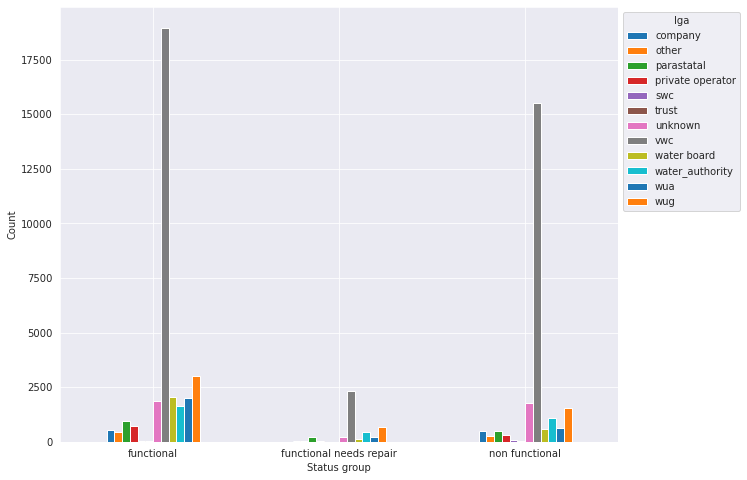

In [54]:
basin = data.groupby("status_group")["scheme_management"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='lga', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of scheme management vs Status Group");

#### 19. permit
This column is categorical column which indicates whether a waterpoint is permited(1) or not(0).

In [117]:
data.permit.nunique()

2

In [118]:
data.permit.value_counts()

True     37054
False    16227
Name: permit, dtype: int64

In [119]:
data.permit.isna().sum()

2785

Am not sure there is much we can do for this column. I'll look to drop the empty rows from this column. I will also convert the boolean values to binary values.

In [55]:
data.dropna(subset= ["permit"], inplace= True)
data["permit"] = np.where(data["permit"] == False, 0, 1)

In [57]:
len(data.loc[data["permit"].isna()])

0

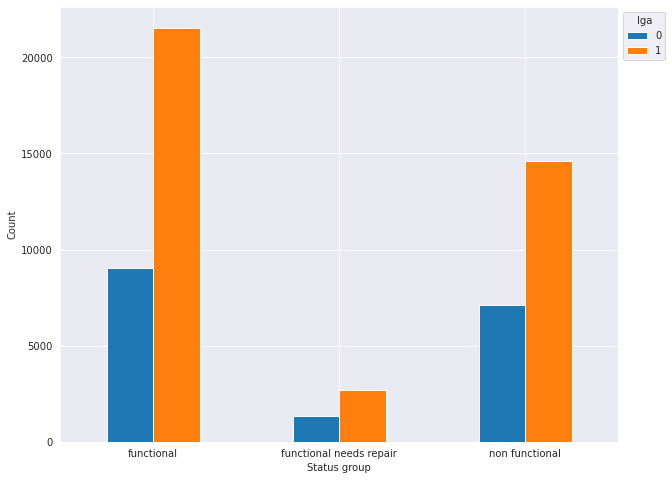

In [57]:
basin = data.groupby("status_group")["permit"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='lga', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of permit vs Status Group");

#### 20. extraction_type, extraction_type_group and extraction_type_class
This column contains the description of the type of machinery the well uses to extract water.

In [123]:
data.extraction_type.nunique()

18

In [124]:
data.extraction_type.value_counts()

gravity                      24339
nira/tanira                   7265
other                         5641
submersible                   3972
swn 80                        3491
mono                          2516
india mark ii                 2261
afridev                       1530
ksb                           1334
other - rope pump              278
other - swn 81                 208
windmill                       104
cemo                            90
india mark iii                  88
other - play pump               84
walimi                          46
climax                          32
other - mkulima/shinyanga        2
Name: extraction_type, dtype: int64

#### extraction_type_class

In [128]:
data.extraction_type_class.nunique()

7

In [129]:
data.extraction_type_class.value_counts()

gravity         24339
handpump        14975
other            5641
submersible      5306
motorpump        2638
rope pump         278
wind-powered      104
Name: extraction_type_class, dtype: int64

In [130]:
# extraction_type_group
data.extraction_type_group.nunique()

13

In [131]:
data.extraction_type_group.value_counts()

gravity            24339
nira/tanira         7265
other               5641
submersible         5306
swn 80              3491
mono                2516
india mark ii       2261
afridev             1530
other handpump       340
rope pump            278
other motorpump      122
wind-powered         104
india mark iii        88
Name: extraction_type_group, dtype: int64

In [87]:
extract = data[["extraction_type", "extraction_type_group", "extraction_type_class"]]
extract.head(10)

,extraction_type,extraction_type_group,extraction_type_class
0,gravity,gravity,gravity
2,gravity,gravity,gravity
3,submersible,submersible,submersible
4,gravity,gravity,gravity
5,submersible,submersible,submersible
6,swn 80,swn 80,handpump
7,nira/tanira,nira/tanira,handpump
8,india mark ii,india mark ii,handpump
9,nira/tanira,nira/tanira,handpump
10,submersible,submersible,submersible


In [110]:
extract[extract["extraction_type"] == "other - mkulima/shinyanga"].head(20)

,extraction_type,extraction_type_group,extraction_type_class
36124,other - mkulima/shinyanga,other handpump,handpump
52144,other - mkulima/shinyanga,other handpump,handpump


In [92]:
extract.extraction_type_class.unique()

array(['gravity', 'submersible', 'handpump', 'other', 'wind-powered',
       'rope pump', 'motorpump'], dtype=object)

In [58]:
data.loc[data["extraction_type_class"] == "rope pump", "extraction_type_class"] = "rope_pump"

In [105]:
extract.extraction_type_group.unique()

array(['gravity', 'submersible', 'swn 80', 'nira/tanira', 'india mark ii',
       'other', 'wind-powered', 'afridev', 'rope pump', 'mono',
       'india mark iii', 'other handpump', 'other motorpump'],
      dtype=object)

In [59]:
data.loc[data["extraction_type_group"].str.contains("swn"), "extraction_type_group"] = "swn"
data.loc[data["extraction_type_group"].str.contains("nira/tanira"), "extraction_type_group"] = "nira_tanira"
data.loc[data["extraction_type_group"].str.contains("india"), "extraction_type_group"] = "india_mark"
data.loc[data["extraction_type_group"].str.contains("other handpump"), "extraction_type_group"] = "handpump"
data.loc[data["extraction_type_group"].str.contains("other motorpump"), "extraction_type_group"] = "motorpump"
data.loc[data["extraction_type_group"].str.contains("mono"), "extraction_type_group"] = "motorpump"
data.loc[data["extraction_type_group"].str.contains("rope pump"), "extraction_type_group"] = "rope_pump"

In [109]:
data.extraction_type_group.unique()

array(['gravity', 'submersible', 'swn', 'nira_tanira', 'india_mark',
       'other', 'wind-powered', 'afridev', 'rope_pump', 'motorpump',
       'handpump'], dtype=object)

In [91]:
extract.extraction_type.unique()

array(['gravity', 'submersible', 'swn 80', 'nira/tanira', 'india mark ii',
       'ksb', 'other', 'windmill', 'afridev', 'other - rope pump', 'mono',
       'india mark iii', 'other - swn 81', 'other - play pump', 'cemo',
       'climax', 'walimi', 'other - mkulima/shinyanga'], dtype=object)

In [60]:
data.loc[data["extraction_type"].str.contains("swn"), "extraction_type"] = "swn"
data.loc[data["extraction_type"].str.contains("nira/tanira"), "extraction_type"] = "nira_tanira"
data.loc[data["extraction_type"].str.contains("play"), "extraction_type"] = "play_pump"
data.loc[data["extraction_type"].str.contains("rope"), "extraction_type"] = "rope_pump"
data.loc[data["extraction_type"].str.contains("india"), "extraction_type"] = "india_mark"
data.loc[data["extraction_type"].str.contains("mkuli"), "extraction_type"] = "walimi"

In [61]:
data.extraction_type.unique()

array(['gravity', 'submersible', 'swn', 'nira_tanira', 'india_mark',
       'ksb', 'other', 'windmill', 'afridev', 'rope_pump', 'mono',
       'play_pump', 'cemo', 'climax', 'walimi'], dtype=object)

There is a hierarchical relationship between this three columns. With more categories in the extraction_type column with neither of the three columns having any missing values. On a granular level, our classification model would benefit greatly from these three columns together in the model however there is a greater chance of overfitting. I will therefore drop the extraction_type_group column.

In [61]:
data.drop("extraction_type_group", axis= 1, inplace= True)
print("extraction type class number of null values ", len(data.loc[data["extraction_type_class"].isna()]))
print("extraction type number of null values ", len(data.loc[data["extraction_type"].isna()]))

extraction type class number of null values  0
extraction type number of null values  0


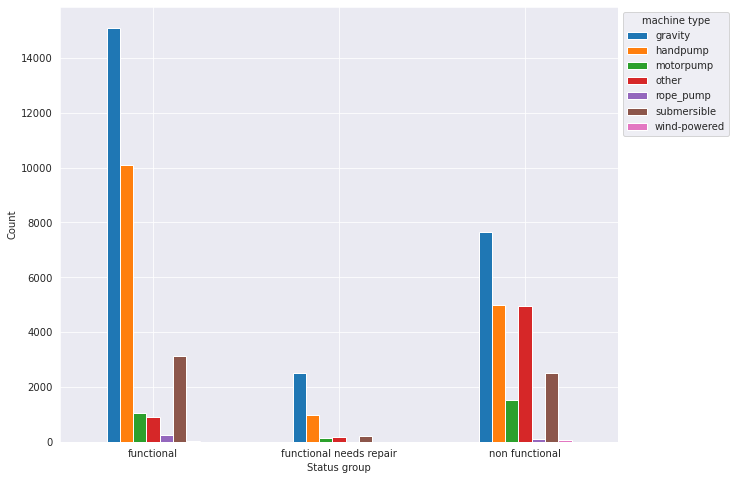

In [63]:
basin = data.groupby("status_group")["extraction_type_class"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='machine type', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of extraction type class vs Status Group");

#### 21. management and management_group

In [117]:
data.management.nunique()

12

In [118]:
data.management.value_counts()

vwc                 37119
wug                  5397
water board          2790
wua                  2455
private operator     1634
parastatal           1348
water authority       800
company               657
other                 627
unknown               277
other - school         99
trust                  76
Name: management, dtype: int64

All entries in these columns are okay. However we will change

In [120]:
data.management_group.nunique()

5

In [121]:
data.management_group.value_counts()

user-group    47761
commercial     3167
parastatal     1348
other           726
unknown         277
Name: management_group, dtype: int64

Since both columns lack any missing values I choose to keep these columns as they are.

In [123]:
manage = data[["management", "management_group"]]
manage.head()

,management,management_group
0,vwc,user-group
2,vwc,user-group
3,vwc,user-group
4,other,other
5,vwc,user-group


In [127]:
manage[manage["management"] == "other - school"].head(5)

,management,management_group
636,other - school,other
4454,other - school,other
4466,other - school,other
5654,other - school,other
6343,other - school,other


The "other-school" entry in the management column could be standardized to reflect school management withought the other. We will do that in the next cell.

In [64]:
data.loc[data["management"].str.contains("school"), "management"] = "school"

In [65]:
print("management null values", len(data.loc[data["management"].isna()]))
print("management null values", len(data.loc[data["management_group"].isna()]))

management null values 0
management null values 0


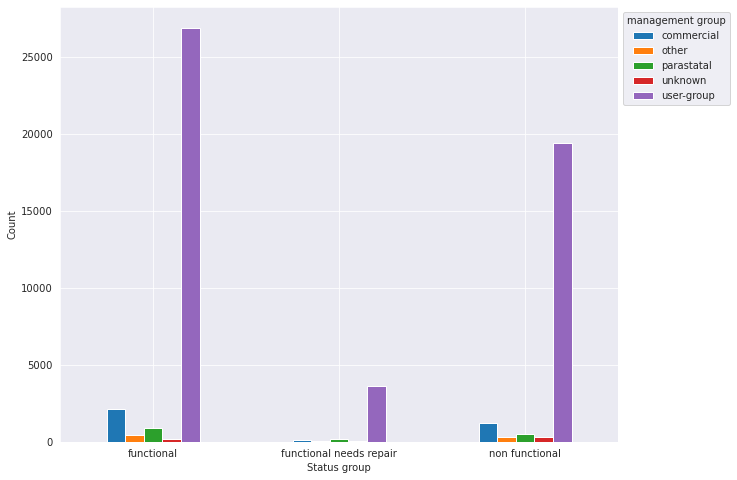

In [66]:
basin = data.groupby("status_group")["management_group"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='management group', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of management group vs Status Group");

#### 22. payment and payment_type

In [128]:
data.payment.nunique()

7

In [129]:
data.payment.value_counts()

never pay                23099
pay per bucket            8304
pay monthly               8148
unknown                   5444
pay when scheme fails     3760
pay annually              3569
other                      955
Name: payment, dtype: int64

#### payment_type

In [131]:
data.payment_type.nunique()

7

In [132]:
data.payment_type.value_counts()

never pay     23099
per bucket     8304
monthly        8148
unknown        5444
on failure     3760
annually       3569
other           955
Name: payment_type, dtype: int64

Both columns seem to contain more or less the same information, I will drop the payment_type column and keep the payment column.

In [67]:
data.drop("payment_type", axis= 1, inplace= True)
print("payment null values", len(data.loc[data["payment"].isna()]))

payment null values 0


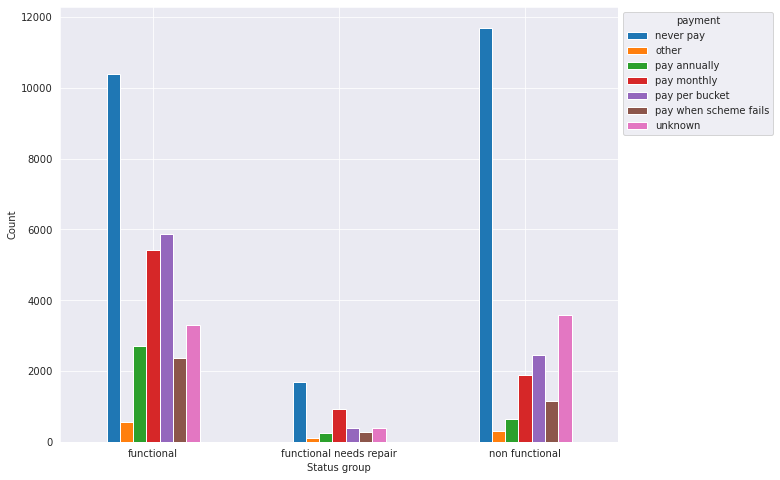

In [68]:
basin = data.groupby("status_group")["payment"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='payment', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of payment vs Status Group");

#### 23. water_quality and quality_group
Both of this columns contained no missing values.

In [218]:
data.water_quality.nunique()

8

In [219]:
data.water_quality.value_counts()

soft                  46163
salty                  4381
unknown                1087
milky                   733
coloured                478
salty abandoned         238
fluoride                183
fluoride abandoned       16
Name: water_quality, dtype: int64

#### quality_group

In [220]:
data.quality_group.nunique()

6

In [221]:
data.quality_group.value_counts()

good        46163
salty        4619
unknown      1087
milky         733
colored       478
fluoride      199
Name: quality_group, dtype: int64

Both of these columns seem to provide the same information about the quality of water in the well. I choose to keep the column that is more refined with more detail to it. I drop the quality_group column.

In [69]:
data.drop("quality_group", axis= 1, inplace= True)
print("water_quality null values", len(data.loc[data["water_quality"].isna()]))

water_quality null values 0


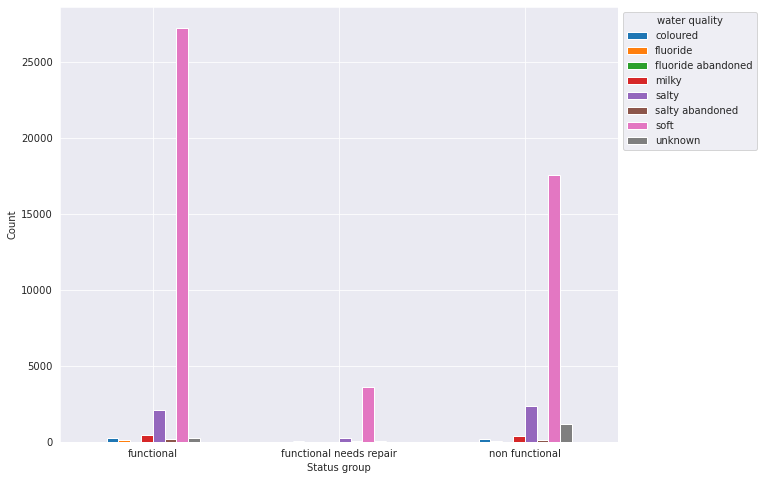

In [76]:
basin = data.groupby("status_group")["water_quality"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='water quality', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of water quality vs Status Group");

#### 24. source, source_type & source_class

#####  source

In [223]:
data.source.nunique()

10

In [224]:
data.source.value_counts()

spring                  15372
shallow well            15043
machine dbh              9578
river                    9180
rainwater harvesting     1865
hand dtw                  785
lake                      628
dam                       589
other                     197
unknown                    42
Name: source, dtype: int64

##### source_type

In [225]:
data.source_type.nunique()

7

In [226]:
data.source_type.value_counts()

spring                  15372
shallow well            15043
borehole                10363
river/lake               9808
rainwater harvesting     1865
dam                       589
other                     239
Name: source_type, dtype: int64

#####  source_class

In [227]:
data.source_class.nunique()

3

In [228]:
data.source_class.value_counts()

groundwater    40778
surface        12262
unknown          239
Name: source_class, dtype: int64

The columns provide the same information on water sources with varying levels of detail. I will remove the middle level of source_type and also format the others entry in the source column to unknown.

In [41]:
data.loc[data["source"] == "other"].head()

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,num_private,basin,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,permit,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,water_quality,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,well_age
5,9944,20.0,Mkinga Distric Coun,0,DWE,39.172796,-4.765587,0,pangani,tanga,4,8,other,moa,1,True,vwc,True,submersible,submersible,submersible,vwc,user-group,pay per bucket,salty,enough,enough,other,other,unknown,communal standpipe multiple,communal standpipe,functional,2
277,65530,0.0,British Colonial Government,0,DWE,39.110137,-4.754611,0,pangani,tanga,4,8,other,duga,1,True,vwc,True,other,other,other,vwc,user-group,never pay,salty abandoned,dry,dry,other,other,unknown,other,other,non functional,50
820,37114,0.0,Mkinga Distric Coun,0,DWE,38.811746,-4.824019,32,pangani,tanga,4,8,other,maramba,50,True,vwc,True,gravity,gravity,gravity,vwc,user-group,never pay,soft,enough,enough,other,other,unknown,communal standpipe,communal standpipe,functional,29
1155,3634,0.0,Mkinga Distric Coun,0,DWE,38.811472,-4.824696,32,pangani,tanga,4,8,other,maramba,1,True,vwc,True,gravity,gravity,gravity,vwc,user-group,never pay,soft,enough,enough,other,other,unknown,communal standpipe,communal standpipe,functional,29
1182,11549,0.0,Finn Water,474,FINN WATER,37.909182,-9.943002,0,ruvuma_southern_coast,lindi,80,43,other,mangirikiti,250,False,vwc,True,other,other,other,vwc,user-group,never pay,soft,dry,dry,other,other,unknown,other,other,non functional,31


In [77]:
# changing the entries
data.loc[data["source"] == "other", "source"] = "unknown"

# dropping the source_type column
data.drop("source_type", axis= 1, inplace= True)

# checking null values in the source and source class columns
print("source null values", len(data.loc[data["source"].isna()]))
print("source class null values", len(data.loc[data["source_class"].isna()]))

source null values 0
source class null values 0


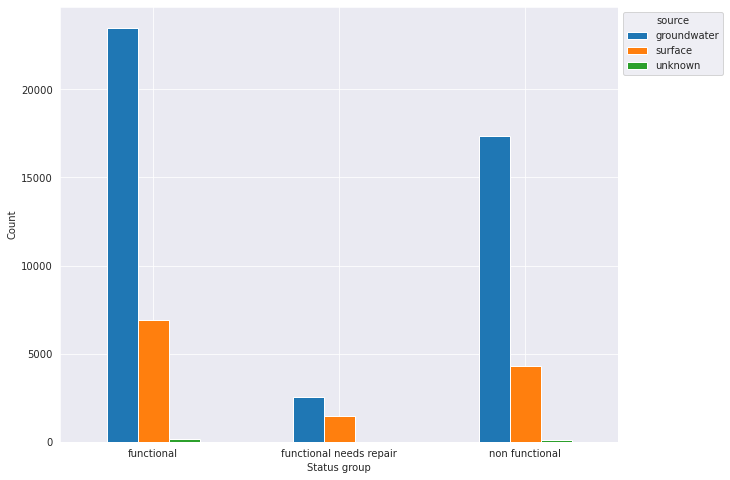

In [78]:
basin = data.groupby("status_group")["source_class"].value_counts().unstack()
ax = basin.plot(kind='bar', figsize=(10, 8), xlabel='Status group', ylabel='Count', rot=0)
ax.legend(title='source', bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig("Graph of water source class vs Status Group");

#### 25. waterpoint_type & waterpoint_type_group

##### waterpoint_type

In [231]:
data.waterpoint_type.nunique()

8

In [232]:
data.waterpoint_type.value_counts()

communal standpipe             25076
hand pump                      15796
communal standpipe multiple     5750
other                           5602
improved spring                  769
unknown                          197
cattle trough                     83
dam                                6
Name: waterpoint_type, dtype: int64

##### waterpoint_type_group

In [233]:
data.waterpoint_type_group.nunique()

7

In [234]:
data.waterpoint_type_group.value_counts()

communal standpipe    30826
hand pump             15796
other                  5602
improved spring         769
unknown                 197
cattle trough            83
dam                       6
Name: waterpoint_type_group, dtype: int64

Both the columns contain the same information with the waterpoint_type column contains a little more detail in terms of categories available. I will therefore drop the waterpoint_type_group column.

In [54]:
data.drop("waterpoint_type_group", axis= 1, inplace= True)
print("waterpoint type null values ", len(data.loc[data["waterpoint_type"].isna()]))

waterpoint type null values  0


#### 26. latitude & longitude

In [236]:
data.latitude.nunique()

51593

In [237]:
data.longitude.nunique()

51591

In [161]:
coordinates = data[["region", "district_code", "latitude", "longitude"]]
coordinates.head()

,region,district_code,latitude,longitude
0,iringa,5,-9.856322,34.938093
2,manyara,4,-3.821329,37.460664
3,mtwara,63,-11.155298,38.486161
4,kagera,1,-1.825359,31.130847
5,tanga,8,-4.765587,39.172796


In [235]:
coordinates.loc[coordinates["latitude"] > -1.00058519, "latitude"] = np.nan
coordinates.loc[coordinates["longitude"] < 29, "longitude"] = np.nan

In [236]:
coordinates.loc[coordinates["longitude"].isna()].head(10)

,region,district_code,latitude,longitude
53,mwanza,6,NaN,NaN
168,shinyanga,1,NaN,NaN
253,mwanza,2,NaN,NaN
256,mwanza,6,NaN,NaN
285,mwanza,2,NaN,NaN
301,mwanza,6,NaN,NaN
306,mwanza,6,NaN,NaN
326,mwanza,6,NaN,NaN
346,shinyanga,1,NaN,NaN
370,mwanza,6,NaN,NaN


In [76]:
coordinates.isna().sum()

region              0
district_code       0
latitude         1461
longitude        1454
dtype: int64

Below, we will fill the latitude values which are zeroes with numpy "nan" values. We will also do the same for the longitudes. Then after I drop the rows with the null values. With longitudes having the highest number of missing values, I use it as condition for dropping the rows.

In [55]:
# Changing the values
data.loc[data["latitude"] > -1.00058519, "latitude"] = np.nan
data.loc[data["longitude"] < 29, "longitude"] = np.nan

In [56]:
data.dropna(subset= ["longitude"], inplace= True)
data.dropna(subset= ["latitude"], inplace= True)

In [57]:
data[["longitude", "latitude"]].isna().sum()

longitude    0
latitude     0
dtype: int64

#### 26. amount_tsh
From the miriam webster definition of Static head is "the height of a column of water at rest that would produce a given pressure". This could be related to the altitude above the sea level as we all know pressure changes with depth.

In [173]:
data.amount_tsh.nunique()

91

In [174]:
data.amount_tsh.value_counts()

0.0         34965
500.0        3028
50.0         2095
1000.0       1440
20.0         1426
200.0        1193
10.0          800
2000.0        684
30.0          682
100.0         659
250.0         569
300.0         551
5000.0        444
5.0           375
3000.0        328
25.0          326
1200.0        266
6.0           189
1500.0        189
600.0         162
4000.0        153
2400.0        145
2500.0        137
6000.0        123
7.0            69
8000.0         60
750.0          59
40.0           58
10000.0        57
12000.0        51
20000.0        44
3600.0         42
450.0          42
400.0          42
2200.0         31
700.0          24
4700.0         22
70.0           22
150.0          20
33.0           20
15.0           15
60.0           15
15000.0        14
2800.0         14
2.0            13
7200.0         12
1300.0         10
6500.0          9
25000.0         9
7500.0          8
35.0            8
30000.0         7
117000.0        7
7000.0          7
40000.0         7
5500.0    

In [59]:
mon = data[["amount_tsh", "gps_height"]]
mon.loc[mon["amount_tsh"] == 0].head()

,amount_tsh,gps_height
3,0.0,263
4,0.0,0
6,0.0,0
7,0.0,0
8,0.0,0


From above we see that the column amount_tsh may have some relation to the gps_height column, I will keep this column since it could directly have an effect on the functioning of the pump.

#### 27. quantity and quantity_group


##### quantity

In [60]:
data.quantity.nunique()

5

In [61]:
data.quantity.value_counts()

enough          29617
insufficient    12889
dry              5194
seasonal         3711
unknown           409
Name: quantity, dtype: int64

In [62]:
data.quantity.isna().sum()

0

##### quantity_group

In [63]:
data.quantity_group.nunique()

5

In [64]:
data.quantity_group.value_counts()

enough          29617
insufficient    12889
dry              5194
seasonal         3711
unknown           409
Name: quantity_group, dtype: int64

These columns seem to be the same. We will drop the quantity_group column and keep the quantity column.

In [65]:
data.drop("quantity_group", axis= 1, inplace= True)

#### 28. id
The id column could hold some information but I don't think it would be usefull to our analysis, so we drop it below.

In [66]:
data.drop("id", axis= 1, inplace= True)

Below we check the structure of the dataset, for missing values.

In [67]:
data.isna().sum()

amount_tsh               0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
basin                    0
region                   0
district_code            0
lga                      0
population               0
public_meeting           0
scheme_management        0
permit                   0
extraction_type          0
extraction_type_class    0
management               0
management_group         0
payment                  0
water_quality            0
quantity                 0
source                   0
source_class             0
waterpoint_type          0
status_group             0
well_age                 0
dtype: int64

In [68]:
data.shape

(51820, 26)

We are done with the EDA process. The data is clean so we proceed to the preprocessing phase.

## 3. Preprocessing
We first save the data into a cleaned_data.csv file.

In [69]:
# data.to_csv("cleaned_data.csv", index= False)

In [2]:
df = pd.read_csv("datasets/cleaned_data.csv")
df.head(3)

,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,district_code,lga,population,public_meeting,scheme_management,permit,extraction_type,extraction_type_class,management,management_group,payment,water_quality,quantity,source,source_class,waterpoint_type,status_group,well_age
0,6000.0,church_orgs,1390,church,34.938093,-9.856322,lake_nyasa,iringa,5,other,109,1,vwc,0,gravity,gravity,vwc,user-group,pay annually,soft,enough,spring,groundwater,communal standpipe,functional,12
1,25.0,others,686,ngos,37.460664,-3.821329,pangani,manyara,4,other,250,1,vwc,1,gravity,gravity,vwc,user-group,pay per bucket,soft,enough,dam,surface,communal standpipe multiple,functional,4
2,0.0,ngos,263,other,38.486161,-11.155298,ruvuma_southern_coast,mtwara,63,other,58,1,vwc,1,submersible,submersible,vwc,user-group,never pay,soft,dry,machine dbh,groundwater,communal standpipe multiple,non functional,27


Our dataset looks good, we divide the dataset into our target and predictor variables.

In [3]:
X = df.drop("status_group", axis= 1)
y = df.status_group

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state= 42, stratify=  y)

In [5]:
numeric = ["amount_tsh", "gps_height", "longitude", "latitude",
           "population", "public_meeting", "permit", "well_age"]
categorical = ["funder", "installer", "basin", "region", "district_code",
               "lga", "scheme_management", "extraction_type", "extraction_type_class",
               "management", "management_group", "payment", "water_quality", "quantity", 
               "source", "source_class", "waterpoint_type"]

We will transform our numeric columns using StandardScaler from sklearn to put all our values on the same scale.

In [6]:
# instantiating a scale
scaler = StandardScaler()

# fitting and transforming the X_train dataset.
X_train_transformed = scaler.fit_transform(X_train[numeric])
X_train_transformed_df = pd.DataFrame(X_train_transformed, index= X_train.index, columns= numeric)

# fitting the scaler on the X_test
X_test_transformed = scaler.transform(X_test[numeric])
X_test_transformed_df = pd.DataFrame(X_test_transformed, index= X_test.index, columns= numeric)

In [8]:
X_train_transformed_df.head()

,amount_tsh,gps_height,longitude,latitude,population,public_meeting,permit,well_age
36273,-0.132854,-0.225806,0.853904,-1.830950,-0.376694,-3.221388,-1.515492,0.483149
33204,-0.132854,0.675956,0.643297,0.914234,-0.113638,0.310425,0.659852,-1.229057
5634,-0.128888,1.582040,0.266082,0.970214,0.029106,0.310425,0.659852,-1.229057
35248,-0.132854,1.321307,0.580372,0.924482,-0.072854,0.310425,0.659852,-1.229057
10540,-0.132854,-0.973433,-0.501771,0.913326,-0.378733,0.310425,-1.515492,0.573265


In [7]:
X_test_transformed_df.head()

,amount_tsh,gps_height,longitude,latitude,population,public_meeting,permit,well_age
42195,-0.132854,-0.668044,1.326255,0.278770,-0.134029,0.310425,-1.515492,-0.868593
30158,-0.130871,0.480046,0.762425,0.935284,-0.307361,0.310425,0.659852,-0.327896
36203,-0.130871,1.194542,0.173391,0.918664,0.029106,0.310425,0.659852,-0.598244
2158,-0.132854,-0.973433,0.363755,0.228427,-0.378733,0.310425,-1.515492,0.483149
14207,-0.132854,1.423583,-1.286726,-1.037385,0.233026,0.310425,-1.515492,-0.057548


Specifically for the Categorical columns, I will use OneHotEncoder from sklearn to transform the various categorical columns. First we make a copy of the categorical columns for both test and train test.

In [8]:
# fitting and transforming the categorical
X_train_category = X_train[categorical]
X_test_category = X_test[categorical]

Next we OneHoetEncode the categorical columns and changing them to a pandas dataframe.

In [9]:
# instantiating ohe
ohe = OneHotEncoder()

# fitting and transforming
ohe.fit(X_train_category)
X_train_encoded_category = ohe.transform(X_train_category).toarray()

# changing it to a dataframe
X_train_encoded_category_df = pd.DataFrame(X_train_encoded_category,
                                           columns= ohe.get_feature_names(X_train_category.columns),
                                           index= X_train.index)
X_train_encoded_category_df.head()

,funder_church_orgs,funder_community,funder_foreign_gvts,funder_islamic,funder_local_government,funder_national_government,funder_ngos,funder_others,funder_unknown,installer_church,installer_foreign_gvt,installer_local_comm,installer_local_gvt,installer_muslim,installer_national_gvt,installer_ngos,installer_other,installer_unknown,basin_internal,basin_lake_nyasa,basin_lake_rukwa,basin_lake_tanganyika,basin_lake_victoria,basin_pangani,basin_rufiji,basin_ruvuma_southern_coast,basin_wami_ruvu,region_arusha,region_dar es salaam,region_dodoma,region_iringa,region_kagera,region_kigoma,region_kilimanjaro,region_lindi,region_manyara,region_mara,region_mbeya,region_morogoro,region_mtwara,region_mwanza,region_pwani,region_rukwa,region_ruvuma,region_shinyanga,region_singida,region_tabora,region_tanga,district_code_0,district_code_1,district_code_2,district_code_3,district_code_4,district_code_5,district_code_6,district_code_7,district_code_8,district_code_13,district_code_23,district_code_30,district_code_33,district_code_43,district_code_53,district_code_60,district_code_62,district_code_63,district_code_67,district_code_80,lga_other,lga_rural,lga_urban,scheme_management_company,scheme_management_other,scheme_management_parastatal,scheme_management_private operator,scheme_management_swc,scheme_management_trust,scheme_management_unknown,scheme_management_vwc,scheme_management_water board,scheme_management_water_authority,scheme_management_wua,scheme_management_wug,extraction_type_afridev,extraction_type_cemo,extraction_type_climax,extraction_type_gravity,extraction_type_india_mark,extraction_type_ksb,extraction_type_mono,extraction_type_nira_tanira,extraction_type_other,extraction_type_play_pump,extraction_type_rope_pump,extraction_type_submersible,extraction_type_swn,extraction_type_walimi,extraction_type_windmill,extraction_type_class_gravity,extraction_type_class_handpump,extraction_type_class_motorpump,extraction_type_class_other,extraction_type_class_rope_pump,extraction_type_class_submersible,extraction_type_class_wind-powered,management_company,management_other,management_parastatal,management_private operator,management_school,management_trust,management_unknown,management_vwc,management_water authority,management_water board,management_wua,management_wug,management_group_commercial,management_group_other,management_group_parastatal,management_group_unknown,management_group_user-group,payment_never pay,payment_other,payment_pay annually,payment_pay monthly,payment_pay per bucket,payment_pay when scheme fails,payment_unknown,water_quality_coloured,water_quality_fluoride,water_quality_fluoride abandoned,water_quality_milky,water_quality_salty,water_quality_salty abandoned,water_quality_soft,water_quality_unknown,quantity_dry,quantity_enough,quantity_insufficient,quantity_seasonal,quantity_unknown,source_dam,source_hand dtw,source_lake,source_machine dbh,source_rainwater harvesting,source_river,source_shallow well,source_spring,source_unknown,source_class_groundwater,source_class_surface,source_class_unknown,waterpoint_type_cattle trough,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_dam,waterpoint_type_hand pump,waterpoint_type_improved spring,waterpoint_type_other
36273,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
33204,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0

In [45]:
X_train_encoded_category_df.shape

(38865, 161)

Performing the above steps on the test set

In [10]:
# transforming X_test
X_test_encoded_category = ohe.transform(X_test_category).toarray()

# changing it into a dataframe
X_test_encoded_category_df = pd.DataFrame(X_test_encoded_category,
                                          columns= ohe.get_feature_names(X_test_category.columns),
                                          index= X_test.index)
X_test_encoded_category_df.head()

,funder_church_orgs,funder_community,funder_foreign_gvts,funder_islamic,funder_local_government,funder_national_government,funder_ngos,funder_others,funder_unknown,installer_church,installer_foreign_gvt,installer_local_comm,installer_local_gvt,installer_muslim,installer_national_gvt,installer_ngos,installer_other,installer_unknown,basin_internal,basin_lake_nyasa,basin_lake_rukwa,basin_lake_tanganyika,basin_lake_victoria,basin_pangani,basin_rufiji,basin_ruvuma_southern_coast,basin_wami_ruvu,region_arusha,region_dar es salaam,region_dodoma,region_iringa,region_kagera,region_kigoma,region_kilimanjaro,region_lindi,region_manyara,region_mara,region_mbeya,region_morogoro,region_mtwara,region_mwanza,region_pwani,region_rukwa,region_ruvuma,region_shinyanga,region_singida,region_tabora,region_tanga,district_code_0,district_code_1,district_code_2,district_code_3,district_code_4,district_code_5,district_code_6,district_code_7,district_code_8,district_code_13,district_code_23,district_code_30,district_code_33,district_code_43,district_code_53,district_code_60,district_code_62,district_code_63,district_code_67,district_code_80,lga_other,lga_rural,lga_urban,scheme_management_company,scheme_management_other,scheme_management_parastatal,scheme_management_private operator,scheme_management_swc,scheme_management_trust,scheme_management_unknown,scheme_management_vwc,scheme_management_water board,scheme_management_water_authority,scheme_management_wua,scheme_management_wug,extraction_type_afridev,extraction_type_cemo,extraction_type_climax,extraction_type_gravity,extraction_type_india_mark,extraction_type_ksb,extraction_type_mono,extraction_type_nira_tanira,extraction_type_other,extraction_type_play_pump,extraction_type_rope_pump,extraction_type_submersible,extraction_type_swn,extraction_type_walimi,extraction_type_windmill,extraction_type_class_gravity,extraction_type_class_handpump,extraction_type_class_motorpump,extraction_type_class_other,extraction_type_class_rope_pump,extraction_type_class_submersible,extraction_type_class_wind-powered,management_company,management_other,management_parastatal,management_private operator,management_school,management_trust,management_unknown,management_vwc,management_water authority,management_water board,management_wua,management_wug,management_group_commercial,management_group_other,management_group_parastatal,management_group_unknown,management_group_user-group,payment_never pay,payment_other,payment_pay annually,payment_pay monthly,payment_pay per bucket,payment_pay when scheme fails,payment_unknown,water_quality_coloured,water_quality_fluoride,water_quality_fluoride abandoned,water_quality_milky,water_quality_salty,water_quality_salty abandoned,water_quality_soft,water_quality_unknown,quantity_dry,quantity_enough,quantity_insufficient,quantity_seasonal,quantity_unknown,source_dam,source_hand dtw,source_lake,source_machine dbh,source_rainwater harvesting,source_river,source_shallow well,source_spring,source_unknown,source_class_groundwater,source_class_surface,source_class_unknown,waterpoint_type_cattle trough,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_dam,waterpoint_type_hand pump,waterpoint_type_improved spring,waterpoint_type_other
42195,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
30158,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0

In [61]:
X_test_encoded_category_df.shape

(12955, 161)

I will combine the test and train columns with their respective transformed numerical columns. I perform a join below:

In [11]:
# train set
X_train_preprocessed = X_train_transformed_df.join(X_train_encoded_category_df)
X_train_preprocessed.shape

(38865, 169)

In [12]:
# test set
X_test_preprocessed = X_test_transformed_df.join(X_test_encoded_category_df)
X_test_preprocessed.shape

(12955, 169)

I create the first model below. I will use the DecisionTreeClassifier module from the sklearn.trees module. with a criterion 'entropy'
##### Decision tree classifier model

In [60]:
y_test.value_counts()

functional                 7112
non functional             4968
functional needs repair     875
Name: status_group, dtype: int64

In [119]:
# instantiating the model
dtc = DecisionTreeClassifier(criterion= "entropy", random_state= 123)

# fittin on the train data
dtc.fit(X_train_preprocessed, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=123)

In [120]:
dtc.score(X_train_preprocessed, y_train)

1.0

Below I make predictions on the test data and check for the prediction on a confusion matrix.

In [121]:
# making prediction on the test set
y_pred = dtc.predict(X_test_preprocessed)

# checking the classification report
print(classification_report(y_test, y_pred))

                         precision    recall  f1-score   support

             functional       0.80      0.79      0.80      7112
functional needs repair       0.34      0.38      0.36       875
         non functional       0.76      0.75      0.75      4968

               accuracy                           0.75     12955
              macro avg       0.63      0.64      0.64     12955
           weighted avg       0.75      0.75      0.75     12955



##### Observations
The model has an accuracy of about 75%. In the context of our problem, I think it would be tolerable to have false positives in out model than false negatives. False positives would indicate that a waterpoint could be nonfunctional when it is not, it would be better to check on a well which is functional even if it is false, rather than not checking on a waterpoint which is not functional and our model predicts it is functional, this could make people suffer from a lack of water.

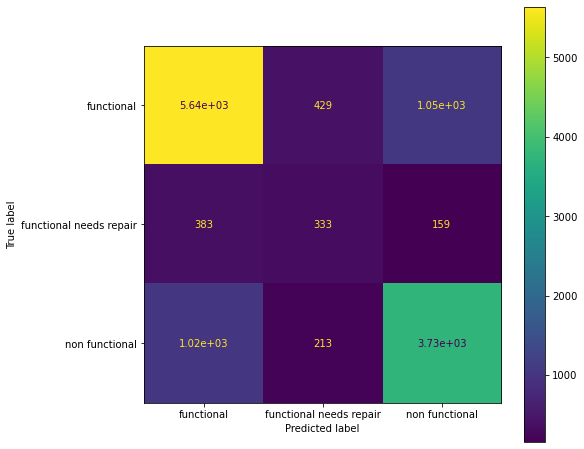

In [17]:
fig, ax = plt.subplots(figsize= (8, 8))
plot_confusion_matrix(dtc, X_test_preprocessed, y_test, values_format= ".3g", ax= ax);

From the above matrix our model was able to predict 5640(functional), 33(functional needs repair) and 3730(non functional) waterpoint accurately. This is about a 75% accuracy, as demonstrated by the previous classification report. Checking the roc_auc_score below.

In [91]:
roc_score = roc_auc_score(y_test, dtc.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

The AUC ROC score is  0.778


We can say that 75% of the time our model will be able to pick out the correct values.

In [103]:
# Do not run!
fig, axes = plt.subplots(figsize = (20,20), dpi= 500)
tree.plot_tree(dtc,
               feature_names = X_test_preprocessed.columns, 
               class_names=np.unique(y).astype('str'),
               filled = True, rounded= True)
plt.show();

Below I will try to fit the same model but with a variation in the criterion. I will use 'gini' for the next model and see if there is any improvement on the model scores.

##### Decision tree model 2

In [122]:
# instantiating the model
dtc2 = DecisionTreeClassifier(criterion= "gini", random_state= 123)

# fittin on the train data
dtc2.fit(X_train_preprocessed, y_train)

# making prediction on the test set
y_pred = dtc2.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, dtc2.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

# checking the classification report
print(classification_report(y_test, y_pred))

The AUC ROC score is  0.779
                         precision    recall  f1-score   support

             functional       0.80      0.80      0.80      7112
functional needs repair       0.36      0.39      0.37       875
         non functional       0.76      0.75      0.75      4968

               accuracy                           0.75     12955
              macro avg       0.64      0.65      0.64     12955
           weighted avg       0.75      0.75      0.75     12955



There is about .01 increase score in the roc score. The model seems to struggle on the minority class with about a .36 precision on its prediction. The model performs better on the dominant class(functional) with a .80  precision score. The general accuracy of the model is about 75%.

I am going to try this model below, I will be using the criterion "entropy" going forward which is the default criterion. We  try to find the best depth below:
##### max_depth

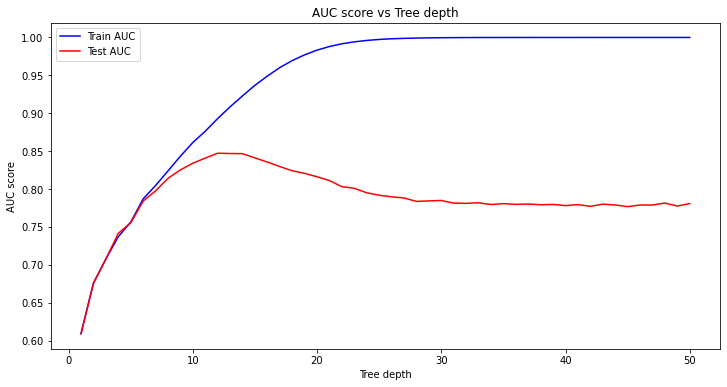

In [102]:
max_depths = np.linspace(1, 50, 50, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
#     instantiate model
    dtc = DecisionTreeClassifier(criterion="entropy", max_depth= max_depth, random_state= 123)
#     fitting on train and predicting on train
    dtc.fit(X_train_preprocessed, y_train)
    train_pred = dtc.predict(X_train_preprocessed)
    roc_score = roc_auc_score(y_train, dtc.predict_proba(X_train_preprocessed),
                            multi_class= "ovr", average= "weighted")
#     Add auc score to previous train results
    train_results.append(roc_score)
#     test
    y_pred = dtc.predict(X_test_preprocessed)
    roc_score = roc_auc_score(y_test, dtc.predict_proba(X_test_preprocessed),
                              multi_class= "ovr", average= "weighted")
#    Add auc score to previous test results
    test_results.append(roc_score)

plt.figure(figsize=(12,6))
plt.plot(max_depths, train_results, 'b', label='Train AUC')
plt.plot(max_depths, test_results, 'r', label='Test AUC')
plt.title('AUC score vs Tree depth')
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.legend();

Implementing the model below with the feature:

In [126]:
# instantiating the model
dtc3 = DecisionTreeClassifier(criterion= "entropy", max_depth= 30, random_state= 123)

# fittin on the train data
dtc3.fit(X_train_preprocessed, y_train)

# making prediction on the test set
y_pred = dtc3.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, dtc3.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

# checking the classification report
print(classification_report(y_test, y_pred))

The AUC ROC score is  0.785
                         precision    recall  f1-score   support

             functional       0.80      0.80      0.80      7112
functional needs repair       0.34      0.38      0.36       875
         non functional       0.77      0.75      0.76      4968

               accuracy                           0.75     12955
              macro avg       0.64      0.64      0.64     12955
           weighted avg       0.76      0.75      0.76     12955



The models roc score starts to somehow level of at depth of 30 on the test set. The score starts to diverge from the train set at about depth 6. I will pick depth of 30 as the max_depth for our model.
##### min_sample_splits

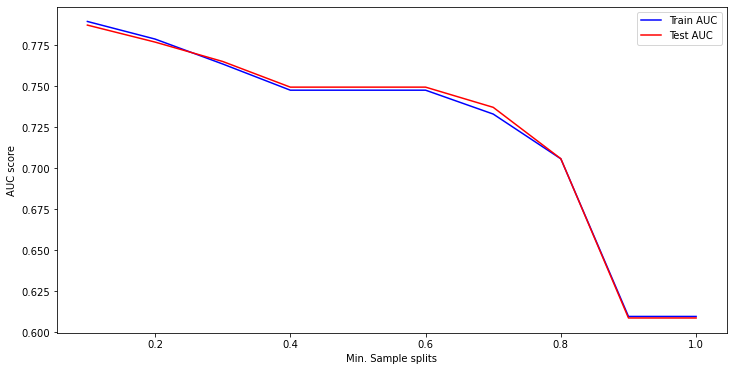

In [100]:
min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)
train_results = []
test_results = []
for min_samples_split in min_samples_splits:
#     instantiate model
    dtc = DecisionTreeClassifier(criterion='entropy', min_samples_split=min_samples_split, random_state=123)
#     fit model and predict on train
    dtc.fit(X_train_preprocessed, y_train)
    train_pred = dtc.predict(X_train_preprocessed)
#     roc score
    roc_score = roc_auc_score(y_train, dtc.predict_proba(X_train_preprocessed),
                            multi_class= "ovr", average= "weighted")
    train_results.append(roc_score)
#     test
    y_pred = dtc.predict(X_test_preprocessed)
    roc_score = roc_auc_score(y_test, dtc.predict_proba(X_test_preprocessed),
                            multi_class= "ovr", average= "weighted")
    test_results.append(roc_score)

plt.figure(figsize=(12,6))
plt.plot(min_samples_splits, train_results, 'b', label='Train AUC')
plt.plot(min_samples_splits, test_results, 'r', label='Test AUC')
plt.xlabel('Min. Sample splits')
plt.ylabel('AUC score')
plt.legend();

In [125]:
# instantiating the model
dtc4 = DecisionTreeClassifier(criterion= "entropy", max_depth= 30, min_samples_split= .1, random_state= 123)

# fittin on the train data
dtc4.fit(X_train_preprocessed, y_train)

# making prediction on the test set
y_pred = dtc4.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, dtc4.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

# checking the classification report
print(classification_report(y_test, y_pred))

The AUC ROC score is  0.787


/home/abbo/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                         precision    recall  f1-score   support

             functional       0.69      0.90      0.78      7112
functional needs repair       0.00      0.00      0.00       875
         non functional       0.75      0.56      0.64      4968

               accuracy                           0.70     12955
              macro avg       0.48      0.48      0.47     12955
           weighted avg       0.66      0.70      0.67     12955



Implementing the above combined features causes an increase in the recall value but accuracy drops overall. I will therefore discard the min_samples_split and use the default value of the classifier.

##### Maximum features

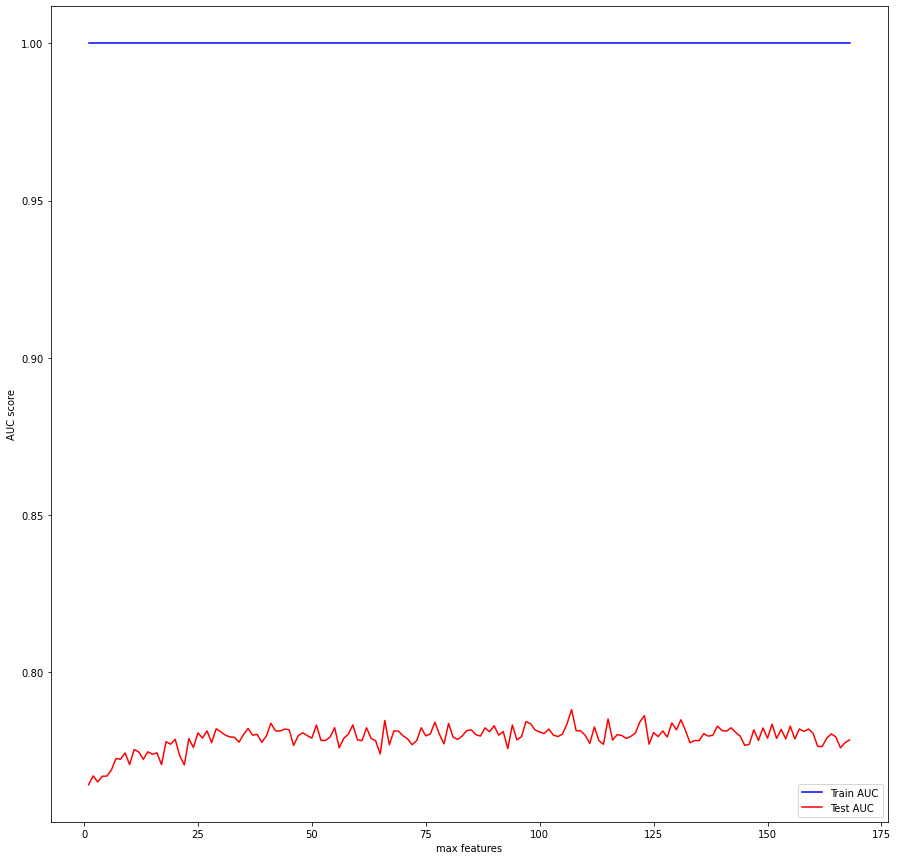

In [108]:
max_features = list(range(1, X_train_preprocessed.shape[1]))
train_results = []
test_results = []
for max_feature in max_features:
#     instantiate model
    dtc = DecisionTreeClassifier(criterion='entropy', max_features=max_feature, random_state= 123)
#     fitting and predict on train
    dtc.fit(X_train_preprocessed, y_train)
    train_pred = dtc.predict(X_train_preprocessed)
#     scoring
    roc_score = roc_auc_score(y_train, dtc.predict_proba(X_train_preprocessed),
                            multi_class= "ovr", average= "weighted")
    train_results.append(roc_score)
#     test
    y_pred = dtc.predict(X_test_preprocessed)
    roc_score = roc_auc_score(y_test, dtc.predict_proba(X_test_preprocessed),
                            multi_class= "ovr", average= "weighted")
    test_results.append(roc_score)

plt.figure(figsize=(15,15))
plt.plot(max_features, train_results, 'b', label='Train AUC')
plt.plot(max_features, test_results, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('max features')
plt.legend();

In [146]:
# instantiating the model
dtc5 = DecisionTreeClassifier(criterion= "entropy", max_depth= 30, max_features= 112, random_state= 123)

# fittin on the train data
dtc5.fit(X_train_preprocessed, y_train)

# making prediction on the test set
y_pred = dtc5.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, dtc5.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

# checking the classification report
print(classification_report(y_test, y_pred))

The AUC ROC score is  0.787
                         precision    recall  f1-score   support

             functional       0.80      0.81      0.81      7112
functional needs repair       0.35      0.36      0.35       875
         non functional       0.77      0.76      0.76      4968

               accuracy                           0.76     12955
              macro avg       0.64      0.64      0.64     12955
           weighted avg       0.76      0.76      0.76     12955



The train set has no changes with a flat roc score line while for the test set, there are fluctuations as the features increase, I estimate the maximum value obtained is about 105 to 115. After a few iterations, I have settled on 112 as the max_features as it offers a small increase in the accuracy score.

##### Minimum sample leafs

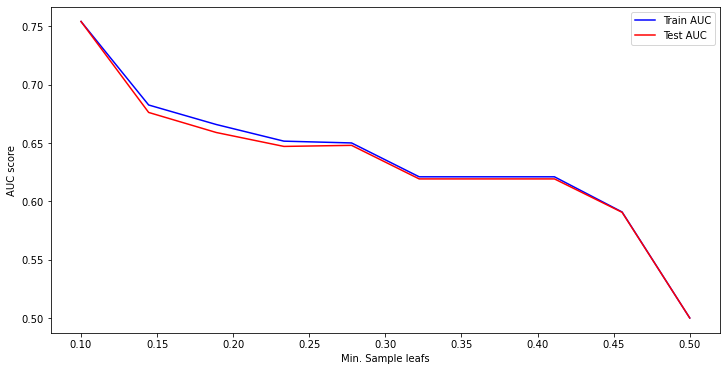

In [131]:
min_sample_leafs = np.linspace(.1, .5, 10, endpoint = True)

train_res = []
test_res = []

for min_sample_leaf in min_sample_leafs:
    dtc = DecisionTreeClassifier(criterion= "entropy", min_samples_leaf= min_sample_leaf, random_state= 123)
    
    # train
    dtc.fit(X_train_preprocessed, y_train)
    y_train_pred = dtc.predict(X_train_preprocessed)
    roc_score = roc_auc_score(y_train, dtc.predict_proba(X_train_preprocessed),
                            multi_class= "ovr", average= "weighted")
    train_res.append(roc_score)
    
    # test
    y_test_pred = dtc.predict(X_test_preprocessed)
    roc_score = roc_auc_score(y_test, dtc.predict_proba(X_test_preprocessed),
                            multi_class= "ovr", average= "weighted")
    test_res.append(roc_score)

plt.figure(figsize=(12,6))
plt.plot(min_sample_leafs, train_res, 'b', label='Train AUC')
plt.plot(min_sample_leafs, test_res, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('Min. Sample leafs')
plt.legend();

In [147]:
# instantiating the model
dtc6 = DecisionTreeClassifier(criterion= "entropy", max_depth= 30, max_features= 112,
                              min_samples_leaf= .1, random_state= 123)

# fittin on the train data
dtc6.fit(X_train_preprocessed, y_train)

# making prediction on the test set
y_pred = dtc6.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, dtc6.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

# checking the classification report
print(classification_report(y_test, y_pred))

The AUC ROC score is  0.713


/home/abbo/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                         precision    recall  f1-score   support

             functional       0.64      0.90      0.75      7112
functional needs repair       0.00      0.00      0.00       875
         non functional       0.71      0.43      0.53      4968

               accuracy                           0.66     12955
              macro avg       0.45      0.44      0.43     12955
           weighted avg       0.62      0.66      0.61     12955



Our best value against the roc score is about .1. I pick this as the best value for the min samples. The model has dropped in overall accuracy. The model also seems it can not distinguish the minority class. I will stick with the 5th model as our best model currently.

I will test a different classifier and see how it fairs against our current best model, dtc5.
#### Random forest classifier

In [13]:
# fiting a random forest classifier
rfc = RandomForestClassifier()

# fitting on the train
rfc.fit(X_train_preprocessed, y_train)

# Checking the score
rfc.score(X_train_preprocessed, y_train)

# predicting on test set
y_pred = rfc.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, rfc.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

print(classification_report(y_test, y_pred))

The AUC ROC score is  0.901
                         precision    recall  f1-score   support

             functional       0.81      0.88      0.84      7112
functional needs repair       0.48      0.36      0.41       875
         non functional       0.83      0.77      0.80      4968

               accuracy                           0.80     12955
              macro avg       0.71      0.67      0.68     12955
           weighted avg       0.80      0.80      0.80     12955



In [154]:
rfc.score(X_train_preprocessed, y_train)

0.9999742699086582

In [153]:
rfc.score(X_test_preprocessed, y_test)

0.8032419915090698

There is clear overfitting on the train data with a loss of 20% in performance in the test data. I wil try tuning the baseline model using grid search with the following predefined parameters:

In [14]:
# Define grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'n_estimators': [2, 3, 4, 5],
    'bootstrap': [False, True]
}

# instantiate
rfc_grid_search = GridSearchCV(rfc, param_grid= param_grid, cv= 3)

# fitting
rfc_grid_search.fit(X_train_preprocessed, y_train)

GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [False, True],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 15],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [2, 3, 4, 5]})

In [17]:
# Mean test score
rfc_gs_testing_score = rfc_grid_search.score(X_test_preprocessed, y_test)

# print(f"Mean Training Score: {rfc_gs_training_score :.2%}")
print(f"Mean Test Score: {rfc_gs_testing_score :.2%}")

Mean Test Score: 78.43%


With no guarantee about finding the optimal parameters for our model, and also the time it takes to execute the grid search, I will resort to another model which though it is computationaly intensive will give me something to compare with the other model.

In [21]:
# fiting a random forest classifier
knn = KNeighborsClassifier()

# fitting on the train
knn.fit(X_train_preprocessed, y_train)

# Checking the score
print("Base knn score is ", knn.score(X_train_preprocessed, y_train))

# predicting on test set
y_pred = knn.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, knn.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

print(classification_report(y_test, y_pred))

Base knn score is  0.8370770616235688
The AUC ROC score is  0.863
                         precision    recall  f1-score   support

             functional       0.78      0.88      0.82      7112
functional needs repair       0.46      0.32      0.38       875
         non functional       0.81      0.71      0.76      4968

               accuracy                           0.77     12955
              macro avg       0.68      0.63      0.65     12955
           weighted avg       0.77      0.77      0.77     12955



The model accuracy has dropped by about 1% from the grid search model however it is better compared to the decision tree model.

In [22]:
# fiting a random forest classifier
knn2 = KNeighborsClassifier(n_neighbors= 50)

# fitting on the train
knn2.fit(X_train_preprocessed, y_train)

# Checking the score
print("Second knn model score is ", knn2.score(X_train_preprocessed, y_train))

# predicting on test set
y_pred = knn2.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, knn2.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

print(classification_report(y_test, y_pred))

Base knn score is  0.7429563874951756
The AUC ROC score is  0.843
                         precision    recall  f1-score   support

             functional       0.72      0.89      0.80      7112
functional needs repair       0.48      0.13      0.20       875
         non functional       0.77      0.61      0.68      4968

               accuracy                           0.73     12955
              macro avg       0.66      0.54      0.56     12955
           weighted avg       0.72      0.73      0.71     12955



Increasing the distance between different data points has reduced the accuracy across board, I will try and introduce a new distance metric from the default and see if there is an improvement.

In [23]:
# fiting a random forest classifier
knn3 = KNeighborsClassifier(n_neighbors= 50, metric= "manhattan")

# fitting on the train
knn3.fit(X_train_preprocessed, y_train)

# Checking the score
print("Third knn model score is ", knn3.score(X_train_preprocessed, y_train))

# predicting on test set
y_pred = knn3.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, knn3.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

print(classification_report(y_test, y_pred))

Third knn model score is  0.7492602598739225
The AUC ROC score is  0.848
                         precision    recall  f1-score   support

             functional       0.73      0.89      0.80      7112
functional needs repair       0.51      0.15      0.23       875
         non functional       0.77      0.62      0.69      4968

               accuracy                           0.74     12955
              macro avg       0.67      0.55      0.57     12955
           weighted avg       0.73      0.74      0.72     12955



The model has improved slightly. We could try fitting the default n_neighbours and then change the distance to manhattan distance and see if there is an improvement on the model.

In [24]:
# fiting a random forest classifier
knn4 = KNeighborsClassifier(metric= "manhattan")

# fitting on the train
knn4.fit(X_train_preprocessed, y_train)

# Checking the score
print("Third knn model score is ", knn4.score(X_train_preprocessed, y_train))

# predicting on test set
y_pred = knn4.predict(X_test_preprocessed)

roc_score = roc_auc_score(y_test, knn4.predict_proba(X_test_preprocessed), multi_class= "ovr", average= "weighted")
print("The AUC ROC score is ", round(roc_score, 3))

print(classification_report(y_test, y_pred))

Third knn model score is  0.8404477035893477
The AUC ROC score is  0.866
                         precision    recall  f1-score   support

             functional       0.78      0.88      0.82      7112
functional needs repair       0.46      0.32      0.38       875
         non functional       0.82      0.71      0.76      4968

               accuracy                           0.77     12955
              macro avg       0.68      0.64      0.65     12955
           weighted avg       0.77      0.77      0.77     12955



This is an improvement from our previous model, however the accuracy is still low compared to what we obtained from our random forest model.

#### Conclusion
I feel accuracy of this models were more dependent on the EDA stage of the data. Therefore for better results, a little bit of feature engineering process in this stage could have benefited our modeling significantly.
#### Recommendation
I would recommend to the ministry to use the random forest model as it looks more promising compared to the other models. The model however struggles to predict the waterpoints that are in need of repair, with about a less than half of a chance the model predicts if a waterpoint needs repair correctly, which is more of guessing than anything else.